# Init

In [ ]:
!if [ -d deepflows ]; then rm -Rf deepflows; fi
!git clone https://github.com/CDGlissov/recurrent-flows-msc.git deepflows
!pip install "./deepflows"

Cloning into 'deepflows'...
remote: Enumerating objects: 75, done.
remote: Counting objects: 100% (75/75), done.
remote: Compressing objects: 100% (74/74), done.
remote: Total 364 (delta 36), reused 0 (delta 0), pack-reused 289
Receiving objects: 100% (364/364), 5.95 MiB | 16.34 MiB/s, done.
Resolving deltas: 100% (195/195), done.
Processing ./deepflows
  Created wheel for recurrent-flows-msc: filename=recurrent_flows_msc-0.1.0-cp36-none-any.whl size=1121 sha256=1ce4f04a95ca997bd039140b5a5041c69f445ce1f49e1c7c119bce1860cbc661
  Stored in directory: /tmp/pip-ephem-wheel-cache-qjigmvol/wheels/f0/5a/77/8518120597d432632c6abe1aa892d29d8c308fccf620551d65
Successfully built recurrent-flows-msc
  Found existing installation: recurrent-flows-msc 0.1.0
    Uninstalling recurrent-flows-msc-0.1.0:
      Successfully uninstalled recurrent-flows-msc-0.1.0


In [ ]:
from deepflows.data_generators import celeba
from deepflows import utils
import numpy as np
import pickle
import time
import matplotlib.pyplot as plt
from tqdm.notebook import trange, tqdm
import torch
import torch.nn as nn
import torch.utils.data
import torch.nn.functional as F
from torch.autograd import Variable
from torchvision.utils import save_image, make_grid
import IPython
import os
import pandas as pd
from scipy import linalg as la
from math import log, pi, exp
from deepflows.data_generators import stochasticShapes
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
from torchvision import transforms
import torch.distributions as td
from deepflows.utils import *
from deepflows.data_generators import stochasticMovingMnist
import matplotlib.patches as patches

device = utils.set_gpu(True)

In [ ]:
torch.cuda.get_device_name(0)

'Tesla T4'

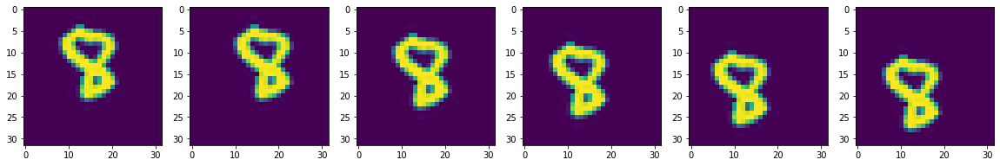

In [ ]:
batch_size = 128
data_set_type = "mnist"
three_channels=False


n_frames = 6
testset = stochasticMovingMnist.MovingMNIST(False, 'Mnist', seq_len=n_frames, image_size=32, digit_size=24, num_digits=1, 
                                            deterministic=False, three_channels=three_channels, step_length=2, normalize=False)
trainset = stochasticMovingMnist.MovingMNIST(True, 'Mnist', seq_len=n_frames, image_size=32, digit_size=24, num_digits=1, 
                                              deterministic=False, three_channels=three_channels, step_length=2, normalize=False)

train_loader=DataLoader(trainset, batch_size=batch_size, shuffle=True, drop_last = True)
test_loader=DataLoader(testset, batch_size=batch_size, shuffle=False, drop_last = True)
x_plot = next(iter(train_loader))[0].permute(0,2,3,1)

if three_channels:
  fig, ax = plt.subplots(1, n_frames, figsize = (20,5))
  for i in range(n_frames): 
    ax[i].imshow(x_plot[i])
  plt.show()
else:
  fig, ax = plt.subplots(1, n_frames, figsize = (20,5))
  for i in range(n_frames): 
    ax[i].imshow(x_plot[i].view(32,32))
  plt.show()




In [ ]:

class ActNorm(nn.Module):

    def __init__(self, num_channels):
        super().__init__()

        size = [1, num_channels, 1, 1]
        self.register_parameter("bias", nn.Parameter(torch.zeros(*size), requires_grad=True))
        self.register_parameter("logs", nn.Parameter(torch.zeros(*size), requires_grad=True))
        
        # Buffer to register if initialization has been performed
        self.register_buffer("initialized", torch.tensor(0, dtype=torch.uint8))

    def initialize(self, input):
      if not self.training:
        return

      with torch.no_grad():
          bias = input.clone().mean(dim=[0, 2, 3], keepdim=True)
          std_input = input.clone().std(dim=[0, 2, 3], keepdim=True)
          logs = (1.0 / (std_input + 1e-6)).log()
          self.bias.data.copy_(-bias)
          self.logs.data.copy_(logs)

    def forward(self, input, logdet=0, reverse=False):
        if self.initialized.item() == 0:
            self.initialize(input)
            self.initialized.fill_(1)
            
        dims = input.size(2) * input.size(3)

        if reverse == False:
            input = input + self.bias
            input = input * torch.exp(self.logs)
            dlogdet = torch.sum(self.logs) * dims
            logdet = logdet + dlogdet

        if reverse == True:
            input = input * torch.exp(-self.logs)
            input = input - self.bias
            dlogdet = - torch.sum(self.logs) * dims
            logdet = logdet + dlogdet

        return input, logdet

class Conv2dZeros(nn.Module):
    def __init__(self, in_channel, out_channel, kernel_size=[3,3], stride=[1,1]):
        super().__init__()
        
        padding = (kernel_size[0] - 1) // 2
        self.conv = nn.Conv2d(in_channels=in_channel, out_channels=out_channel, kernel_size=kernel_size, stride=stride, padding=padding)
        
        self.conv.weight.data.zero_()
        self.conv.bias.data.zero_()

    def forward(self, input):
      output = self.conv(input)
      return output 




class Conv2dNorm(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=[3, 3], stride=[1, 1], norm = "actnorm"):
        super().__init__()

        padding = [(kernel_size[0]-1)//2, (kernel_size[1]-1)//2]

        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=(norm != "actnorm"))
        self.conv.weight.data.normal_(mean=0.0, std=0.05)
        
        self.norm = norm
        if self.norm == "actnorm":
          self.norm_type = ActNorm(out_channels)
        elif self.norm=="batchnorm":
          self.conv.bias.data.zero_()
          self.norm_type = nn.BatchNorm2d(out_channels)

    def forward(self, input):
        output = self.conv(input)
        if self.norm == "actnorm":
          output,_ = self.norm_type(output)
        elif self.norm == "batchnorm":
          output = self.norm_type(output)
        else:
          return output
        return output

class Conv2dResize(nn.Module):
    def __init__(self, in_size, out_size, kernel_size = [3,3], stride = 2, norm="actnorm", manual = False):
        super().__init__()
        #condition size = in size
        if not manual:
          stride = [in_size[1]//out_size[1], in_size[2]//out_size[2]]
          kernel_size = Conv2dResize.compute_kernel_size(in_size, out_size, stride)
        else:
          stride = stride
          kernel_size = kernel_size
        if norm == None:
          self.conv = nn.Conv2d(in_channels=in_size[0], out_channels=out_size[0], kernel_size=kernel_size, stride=stride, bias = True)
          self.conv.bias.data.zero_()
        else:
          self.conv = nn.Conv2d(in_channels=in_size[0], out_channels=out_size[0], kernel_size=kernel_size, stride=stride, bias = False)
        self.conv.weight.data.zero_()
        
        self.norm = norm
        if self.norm == "actnorm":
          self.norm_type = ActNorm(out_size[0])
        elif self.norm=="batchnorm":
          self.norm_type = nn.BatchNorm2d(out_size[0])

    @staticmethod
    def compute_kernel_size(in_size, out_size, stride):
        k0 = in_size[1] - (out_size[1] - 1) * stride[0]
        k1 = in_size[2] - (out_size[2] - 1) * stride[1]
        return[k0, k1]

    def forward(self, input):
      output = self.conv(input)
      if self.norm == "actnorm":
        output,_ = self.norm_type(output)
      elif self.norm == "batchnorm":
        output = self.norm_type(output)
      return output 

class ActFun(nn.Module):
  def __init__(self, non_lin, in_place = False):
    super(ActFun, self).__init__()
    if non_lin=='relu':
      self.net=nn.ReLU(inplace = in_place)
    if non_lin=='leakyrelu':
      self.net=nn.LeakyReLU(negative_slope=0.20, inplace = in_place)

  def forward(self,x):
    return self.net(x)

In [ ]:
non_lin = "relu"

class InvConv(nn.Module):
    def __init__(self, num_channels, LU_decomposed):
        super().__init__()
        w_shape = [num_channels, num_channels]
        w_init = torch.qr(torch.randn(*w_shape))[0]

        if not LU_decomposed:
            self.weight = nn.Parameter(torch.Tensor(w_init))
        else:
            p, lower, upper = torch.lu_unpack(*torch.lu(w_init))
            s = torch.diag(upper)
            sign_s = torch.sign(s)
            log_s = torch.log(torch.abs(s))
            upper = torch.triu(upper, 1)
            l_mask = torch.tril(torch.ones(w_shape), -1)
            eye = torch.eye(*w_shape)

            self.register_buffer("p", p)
            self.register_buffer("sign_s", sign_s)
            self.lower = nn.Parameter(lower)
            self.log_s = nn.Parameter(log_s)
            self.upper = nn.Parameter(upper)
            self.l_mask = l_mask
            self.eye = eye

        self.w_shape = w_shape
        self.LU_decomposed = LU_decomposed

    def get_weight(self, input, reverse):
        b, c, h, w = input.shape

        if not self.LU_decomposed:
            dlogdet = torch.slogdet(self.weight)[1] * h * w
            if reverse:
                weight = torch.inverse(self.weight)
            else:
                weight = self.weight
        else:
            self.l_mask = self.l_mask.to(input.device)
            self.eye = self.eye.to(input.device)

            lower = self.lower * self.l_mask + self.eye

            u = self.upper * self.l_mask.transpose(0, 1).contiguous()
            u += torch.diag(self.sign_s * torch.exp(self.log_s))

            dlogdet = torch.sum(self.log_s) * h * w

            if reverse:
                u_inv = torch.inverse(u)
                l_inv = torch.inverse(lower)
                p_inv = torch.inverse(self.p)

                weight = torch.matmul(u_inv, torch.matmul(l_inv, p_inv))
            else:
                weight = torch.matmul(self.p, torch.matmul(lower, u))

        return weight.view(self.w_shape[0], self.w_shape[1], 1, 1), dlogdet

    def forward(self, input, logdet=None, reverse=False):
        weight, dlogdet = self.get_weight(input, reverse)

        if not reverse:
            z = F.conv2d(input, weight)
            if logdet is not None:
                logdet = logdet + dlogdet
            return z, logdet
        else:
            z = F.conv2d(input, weight)
            if logdet is not None:
                logdet = logdet - dlogdet
            return z, logdet

class AffineCoupling(nn.Module):
    def __init__(self, x_size, condition_size):
        super(AffineCoupling, self).__init__()
        
        Bx, Cx, Hx, Wx = x_size
        B, C, H, W = condition_size
        
        temp = torch.zeros(condition_size)
        temp = temp.view(Bx, -1, Hx, Wx)

        hidden_channels = 128
        self.net = nn.Sequential(
            Conv2dNorm(Cx // 2 + temp.shape[1], hidden_channels),
            ActFun(non_lin),
            Conv2dNorm(hidden_channels, hidden_channels, kernel_size=[1, 1]),
            ActFun(non_lin),
            Conv2dZeros(hidden_channels, Cx),
        )

        self.scale = nn.Parameter(torch.zeros(Cx//2, 1, 1), requires_grad=True)
        self.scale_shift = nn.Parameter(torch.zeros(Cx//2, 1, 1), requires_grad=True)
        
    def forward(self, x, condition, logdet=0.0, reverse=False): # how to match condition here for L>1
        condition = condition.view(x.shape[0], -1, x.shape[2], x.shape[3])
        assert condition.shape[2:4] == x.shape[2:4], "condition and x in affine needs to match"
        z1, z2 = utils.split_feature(x, "split")

        h = torch.cat([z1, condition], dim=1)
        shift, log_scale = utils.split_feature(self.net(h), "cross")

        log_scale = self.scale * torch.tanh(log_scale) + self.scale_shift

        if reverse == False:
            z2 = z2 + shift
            z2 = z2 * torch.exp(log_scale)
            logdet += torch.sum(log_scale, dim=[1, 2, 3])
        else:
            z2 = z2 * log_scale.mul(-1).exp()
            z2 = z2 - shift
            logdet -= torch.sum(log_scale, dim=[1, 2, 3]) 

        output = torch.cat((z1, z2), dim=1)
        return output, logdet




class GlowStep(nn.Module):
    def __init__(self, x_size, condition_size, LU_decompose):
      super(GlowStep, self).__init__()
      
      b, c, h, w = x_size
      bc, cc, hc, wc = condition_size
      self.actnorm = ActNorm(c)
      self.invconv =  InvConv(c, LU_decomposed = LU_decompose)
      self.affine =  AffineCoupling(x_size, condition_size)
       
    def forward(self, x, condition, logdet=None, reverse=False):
        if reverse == False:
            x, logdet = self.actnorm(x, logdet, reverse=False)
            x, logdet = self.invconv(x, logdet, reverse=False)
            x, logdet = self.affine(x, condition, logdet, reverse=False)
            return x, logdet
        else:
            x, logdet = self.affine(x, condition, logdet, reverse=True)
            x, logdet = self.invconv(x, logdet, reverse=True)
            x, logdet = self.actnorm(x, logdet, reverse=True)
            return x, logdet


class Squeeze2d(nn.Module):
    def __init__(self):
        super(Squeeze2d, self).__init__()
        
    def forward(self, x, undo_squeeze = False):
      B, C, H, W = x.shape
      if undo_squeeze == False:
        # C x H x W -> 4C x H/2 x W/2
        x = x.reshape(B, C, H // 2, 2, W // 2, 2)
        x = x.permute(0, 1, 3, 5, 2, 4)
        x = x.reshape(B, C * 4, H // 2, W // 2)
      else:
        # 4C x H/2 x W/2  ->  C x H x W
        x = x.reshape(B, C // 4, 2, 2, H, W)
        x = x.permute(0, 1, 4, 2, 5, 3)
        x = x.reshape(B, C // 4, H * 2, W * 2)
      return x


class Split2d(nn.Module):
    def __init__(self, x_size, condition_size):
      super(Split2d, self).__init__()

      B, C, H, W = condition_size
      Bx, Cx, Hx, Wx = x_size

      temp = torch.zeros(condition_size)
      temp = temp.view(Bx, -1, Hx, Wx)

      self.conv = nn.Sequential(Conv2dZeros(Cx // 2 + temp.shape[1], Cx),)
      

    def forward(self, x, condition, logdet=0.0, reverse=False): # how to match condition here for L>1
        
        condition = condition.view(x.shape[0], -1, x.shape[2], x.shape[3])

        if reverse == False:
            z1, z2 = utils.split_feature(x, "split")
            h = torch.cat([z1, condition], dim=1)
            out = self.conv(h)
            mean, log_scale = utils.split_feature(out, "cross")
            logdet += torch.sum(td.Normal(mean, torch.exp(log_scale)).log_prob(z2), dim=(1,2,3))
            return z1, logdet
        else:
            h = torch.cat([x, condition], dim=1)
            mean, log_scale = utils.split_feature(self.conv(h), "cross")
            z2 = td.Normal(mean, torch.exp(log_scale)).rsample()
            z = torch.cat((x, z2), dim=1)
            return z, logdet

class Glow(nn.Module):
    def __init__(self, x_size, condition_size, K = 12, L = 2, learn_prior = True, LU_decompose = True):
        super(Glow, self).__init__()

        self.L = L
        self.K = K
        Bx, Cx, Hx, Wx = x_size
        Bc, Cc, Hc, Wc = condition_size
        layers = []

        # Set up structure
        for l in range(0, L):
            layers.append(Squeeze2d())
            Cx, Hx, Wx = Cx * 4, Hx // 2, Wx // 2
            x_size =  [Bx, Cx, Hx, Wx]
            for i in range(0, K):
                layers.append(GlowStep(x_size, condition_size, LU_decompose))
            
            if l < (L-1):
                layers.append(Split2d(x_size, condition_size)) 
                Cx = Cx // 2 
                x_size = [Bx, Cx, Hx, Wx]

        self.glow_frame = nn.ModuleList(layers)


        self.learn_prior = learn_prior
        if learn_prior == True:
          self.register_buffer("prior_in", torch.zeros([1, Cx, Hx, Wx,]), )
          self.prior = nn.Sequential(
              Conv2dResize((Cc, Hc, Wc), out_size=(64, Hx*2, Wx*2), norm=None),
              ActFun(non_lin),
              Conv2dResize((64, Hx*2, Wx*2), out_size=(32, Hx, Wx), norm=None),
              ActFun(non_lin),
              Conv2dZeros(in_channel=32, out_channel=2*Cx)
              )
        else:
          self.register_buffer("prior_in", torch.zeros([1, 2*Cx, Hx, Wx,]), )

    def g(self, z, condition, logdet=0.0):
        # maps z -> x
        x = z
        for step in reversed(self.glow_frame):
          if isinstance(step, Squeeze2d):
            x = step(x, undo_squeeze=True)
          elif isinstance(step, Split2d):
            x, _ = step(x, condition, logdet = logdet, reverse=True)
          else:
            x, _ = step(x, condition, logdet = logdet, reverse=True)
        return x, logdet

    def f(self, x, condition, logdet=0.0):
        # maps x -> z
        z = x
        for step in self.glow_frame:
            if isinstance(step, Squeeze2d):
                z = step(z)
            elif isinstance(step, Split2d):
                z, logdet = step(z, condition, logdet = logdet, reverse=False)
            else:
                z, logdet = step(z, condition, logdet=logdet, reverse=False)
        return z, logdet
    
    def log_prob(self, x, condition, log_det):
        dims = torch.prod(torch.tensor(x.shape[1:]))
        z, obj = self.f(x, condition, log_det)
        
        z_in = condition
        if self.learn_prior:
          mean, log_scale = utils.split_feature(self.prior(z_in), type="split")
        else:
          mean, log_scale = utils.split_feature(z_in, type="split")
        prior = td.Normal(mean, torch.exp(log_scale))
        obj += torch.sum(prior.log_prob(z), dim=(1,2,3)) #p_z
        obj = torch.mean(obj)
        nll = (-obj) / float(np.log(2.) * dims)
        return z, nll

    def sample(self, z, condition, num_samples):
        temperature = 0.8
        with torch.no_grad():

          if z == None:
            z_in = condition
            if self.learn_prior:
              mean, log_scale = utils.split_feature(self.prior(z_in), type="split")
            else:
              mean, log_scale = utils.split_feature(z_in, type="split")
            prior = td.Normal(mean, torch.exp(log_scale)*temperature)
            z = prior.sample().to(device)
          x, logdet = self.g(z, condition)
        return x


#RFN

In [ ]:

class ConvLSTMLayer(nn.Module):
    # Only works with 3x3 kernels
    def __init__(self, in_channels, hidden_channels, kernel_size, bias, dropout = 0, peephole=True, norm = False):
        super(ConvLSTMLayer, self).__init__()
        self.in_channels = in_channels
        self.hidden_channels = hidden_channels
        self.kernel_size = kernel_size 
        self.peephole = peephole
        self.padding = ((kernel_size[0] - 1) // 2, (kernel_size[1] - 1) // 2)
        self.bias = bias
        layers = []

        layers.append(nn.Conv2d(in_channels = self.in_channels + self.hidden_channels,
                              out_channels = 4 * self.hidden_channels,
                              kernel_size = self.kernel_size,
                              stride = 1,
                              padding = self.padding,
                              bias = self.bias))

        if norm == True:
          layers.append(nn.GroupNorm(4 * self.hidden_channels // 32, 4 * self.hidden_channels))
        if dropout != 0:
          layers.append(nn.Dropout2d(p = dropout))

        self.conv = nn.Sequential(*layers)

        self.init_done = False
        self.apply(self.initialize_weights)

    def forward(self, input_tensor, cur_state):
        b, c, h, w = input_tensor.shape
        if cur_state[0] == None:
          h_cur = nn.Parameter(torch.zeros(b, self.hidden_channels, h, w)).to(device)
          c_cur = nn.Parameter(torch.zeros(b, self.hidden_channels, h, w)).to(device)
        else:
          h_cur, c_cur = cur_state

        if self.init_done == False:
          self.initialize_peephole(h, w)
          self.init_done = True

        combined = torch.cat([input_tensor, h_cur], dim=1)
        combined_conv = self.conv(combined)

        cc_i, cc_f, cc_o, cc_g = torch.split(combined_conv, self.hidden_channels, dim=1)
        i = torch.sigmoid(cc_i + self.Wci * c_cur)
        f = torch.sigmoid(cc_f + self.Wcf * c_cur)
        g = torch.tanh(cc_g)
        c_next = f * c_cur + i * g
        o = torch.sigmoid(cc_o + self.Wco*c_next)
        h_next = o * torch.tanh(c_next)
        return h_next, c_next
    

    def initialize_weights(self, layer):
      if type(layer) == nn.Conv2d:
        nn.init.xavier_normal_(layer.weight)
        nn.init.uniform_(layer.bias)
    
    def initialize_peephole(self, height, width):
      if self.peephole:
        self.Wci = nn.Parameter(torch.zeros(1, self.hidden_channels, height, width)).to(device)
        self.Wcf = nn.Parameter(torch.zeros(1, self.hidden_channels, height, width)).to(device)
        self.Wco = nn.Parameter(torch.zeros(1, self.hidden_channels, height, width)).to(device)
      else:
        self.Wci = 0
        self.Wcf = 0
        self.Wco = 0
        
class ConvLSTM(nn.Module):
    def __init__(self, in_channels, hidden_channels, kernel_size, bias=True, dropout = 0, peephole=True, norm = False):
        super(ConvLSTM, self).__init__()
        self.hidden_channels = hidden_channels
        self.LSTMlayer = ConvLSTMLayer(in_channels=in_channels,
                                          hidden_channels=hidden_channels,
                                          kernel_size=kernel_size,
                                          bias=bias, dropout=dropout, peephole = peephole,
                                          norm = norm)
    
    def forward(self, x, ht=None, ct=None):
        b, seq_len, channel, h, w = x.size()
        output = []

        for t in range(seq_len):
            ht, ct = self.LSTMlayer(input_tensor=x[:, t, :, :, :],
                                              cur_state=[ht, ct])
            output.append(ht)
        return torch.stack(output,1), ht, ct

In [ ]:
class ActFun(nn.Module):
  def __init__(self, non_lin, in_place = False):
    super(ActFun, self).__init__()
    if non_lin=='relu':
      self.net=nn.ReLU(inplace = in_place)
    if non_lin=='leakyrelu':
      self.net=nn.LeakyReLU(negative_slope=0.20, inplace = in_place)

  def forward(self,x):
    return self.net(x)

In [ ]:
non_lin = "leakyrelu"
class Model(nn.Module):
    def __init__(self):
      super(Model, self).__init__()

      self.batch_size = batch_size
      self.u_dim = (self.batch_size, 1, 32, 32)
      self.x_dim = (self.batch_size, 1, 32, 32)
      self.h_dim = 20
      self.z_dim = 1
      self.beta = 1
      self.L = 3
      self.K = 16

      # Settings #
      self.extract = True

      # Transition constructor
      out_dim_u = 16
      out_dim_x = out_dim_u
      self.condition_extractor = nn.Sequential(
          nn.Conv2d(self.u_dim[1], 128, kernel_size=3, stride=2, padding=1), 
          nn.BatchNorm2d(128),
          ActFun(non_lin),
          nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1), 
          nn.BatchNorm2d(64),
          ActFun(non_lin),
          nn.Conv2d(64, out_dim_u, kernel_size=3, stride=1, padding=1),
          nn.BatchNorm2d(out_dim_u),
          ActFun(non_lin),
        )
      
      if self.extract:
        hu, wu = utils.get_layer_size([self.u_dim[2], self.u_dim[3]], kernels=[3, 3], 
                                    paddings=[1, 1], strides=[2, 1],
                                    dilations=[1, 1])
        self.u_dim = (self.batch_size, out_dim_u, hu, wu)
      
      self.h_0 = nn.Parameter(torch.zeros(self.batch_size, self.h_dim, self.u_dim[2], self.u_dim[3])).to(device)
      self.c_0 = nn.Parameter(torch.zeros(self.batch_size, self.h_dim, self.u_dim[2], self.u_dim[3])).to(device)
      self.lstm = ConvLSTM(in_channels = self.u_dim[1], hidden_channels=self.h_dim, kernel_size=[5, 5], bias=True, peephole=True).to(device)

      self.z_0 = nn.Parameter(torch.zeros(self.batch_size, self.z_dim, self.u_dim[2], self.u_dim[3]).to(device))
      self.z_0x = nn.Parameter(torch.zeros(self.batch_size, self.z_dim, self.u_dim[2], self.u_dim[3]).to(device))
      
      #
      self.prior = nn.Sequential(nn.Conv2d(self.h_dim + self.z_dim, 64,  kernel_size=3, stride=1, padding=1),
                                          nn.BatchNorm2d(64),
                                          ActFun(non_lin),)
      self.prior_mean =  nn.Conv2d(64, self.z_dim,  kernel_size=3, stride=1, padding=1)
      self.prior_std =  nn.Sequential(nn.Conv2d(64, self.z_dim,  kernel_size=3, stride=1, padding=1), nn.Softplus())

      Bx, Cx, Hx, Wx = self.x_dim
      for l in range(0, self.L):
          Cx, Hx, Wx = Cx * 4, Hx // 2, Wx // 2
          if l < (self.L-1):
              Cx = Cx // 2 
      _, _, Hu, Wu = self.u_dim

      flow_condition_dim = (self.batch_size, self.z_dim + self.h_dim, Hu, Wu)
      self.flow = Glow(self.x_dim, flow_condition_dim, K=self.K, L=self.L, learn_prior = True)

      # Now eq. 15. To concat ht, zt-1 and xt we need to downscale x_t first to match dimensions
      stride_x_extr = [self.x_dim[2] // self.u_dim[2], self.x_dim[3] // self.u_dim[3]]
      kernel_x_extr = [self.x_dim[2] - (self.u_dim[2] - 1) * stride_x_extr[0], self.x_dim[3] - (self.u_dim[3] - 1) * stride_x_extr[1]]

      self.encoder = nn.Sequential(
          nn.Conv2d(in_channels = out_dim_x + self.h_dim + self.z_dim, out_channels = 128, kernel_size=3, stride=1, padding = 1), 
          nn.BatchNorm2d(128), 
          ActFun(non_lin),
          nn.Conv2d(128, 256,  kernel_size=3, stride=1, padding=1), 
          nn.BatchNorm2d(256), 
          ActFun(non_lin),
      )

      self.encoder_mean =  nn.Conv2d(256, self.z_dim,  kernel_size=3, stride=1, padding=1)
      self.encoder_std =  nn.Sequential(nn.Conv2d(256, self.z_dim,  kernel_size=3, stride=1, padding=1), nn.Softplus())
      
      self.book = {"zt": 0, "b": 0, "enc_loc": 0, "ht": 0, "kl": 0, "nll": 0}
    
    def get_inits(self):
      return self.h_0, self.c_0, self.z_0, self.z_0x

    def loss(self, xt, log_det):
      hprev,cprev,zprev,zxprev= self.get_inits()
      loss = 0
      kld_loss = 0
      nll_loss = 0

      t = xt.shape[1]

      features = []
      for i in range(0, t):
        features.append(self.condition_extractor(xt[:, i, :, :, :]))
      
      for i in range(1, t):
        u_feature = features[i-1]
        x_feature = features[i]
        _, ht, ct = self.lstm(u_feature.unsqueeze(1), hprev, cprev)


        out = self.prior(torch.cat((zprev, ht), dim = 1))
        prior_mean = self.prior_mean(out)
        prior_std = self.prior_std(out)
        dist_prior = td.Normal(prior_mean, prior_std)
        zt = dist_prior.rsample()
        
        encoder_input = torch.cat((zxprev, ht, x_feature), dim = 1)
        out = self.encoder(encoder_input)
        enc_mean = self.encoder_mean(out)
        enc_std = self.encoder_std(out)
        dist_enc = td.Normal(enc_mean, enc_std)
        zxt = dist_enc.rsample()

        flow_conditions = torch.cat((zxt, ht), dim = 1)
        b, nll = self.flow.log_prob(xt[:, i, :, :, :], flow_conditions, log_det)

        kld_loss += td.kl_divergence(dist_enc, dist_prior).sum([1,2,3]).mean()
        nll_loss += nll 
        
        hprev = ht
        cprev = ct
        zprev = zt
        zxprev = zxt
        
      # Book keeping
      dims_z = torch.prod(torch.tensor(enc_std.shape[1:]))
      
      self.book["zt"] = zt.detach()
      self.book["b"] = b.detach()
      self.book["enc_loc"] = enc_mean.detach()
      self.book["ht"] = ht.detach()
      self.book["kl"] = (kld_loss/dims_z).detach()
      self.book["nll"] = nll_loss.detach()

      loss = (self.beta)*kld_loss/dims_z + nll_loss

      return loss


    def sample(self, x, temperature=0.8):
      hprev, cprev, zprev, zxprev = self.get_inits()

      t = x.shape[1]

      features = []
      for i in range(0, t):
        features.append(self.condition_extractor(x[:, i, :, :, :]))

      samples= torch.zeros((t-1, *x[:,0,:,:,:].shape))
      for i in range(1, t):
        cond_features = features[i-1]

        _, ht, ct = self.lstm(cond_features.unsqueeze(1), hprev, cprev)

        out = self.prior(torch.cat((zxprev, ht), dim = 1))
        prior_mean = self.prior_mean(out)
        prior_std = self.prior_std(out)
        dist_prior = td.Normal(prior_mean, prior_std)
        zt = dist_prior.rsample()

        flow_conditions = torch.cat((zt, ht), dim = 1)
        sample = self.flow.sample(None, flow_conditions, num_samples=10)

        samples[i-1,:,:,:,:] = sample
        hprev = ht
        cprev = ct
        zprev = zt

      return samples

    def sample_enc(self, x, temperature=0.8):
      hprev, cprev, zprev, zxprev = self.get_inits()

      t = x.shape[1]

      features = []
      for i in range(0, t):
        features.append(self.condition_extractor(x[:, i, :, :, :]))

      samples= torch.zeros((t-1, *x[:,0,:,:,:].shape))
      ht_list = torch.zeros((t-1, *hprev.shape)).to(device)
      for i in range(1, t):
        cond_features = features[i-1]
        x_features = features[i]

        _, ht, ct = self.lstm(cond_features.unsqueeze(1), hprev, cprev)
        ht_list[i-1, :, : ,:,:] = ht
        out = self.prior(torch.cat((zxprev, ht), dim = 1))
        prior_mean = self.prior_mean(out)
        prior_std = self.prior_std(out)
        dist_prior = td.Normal(prior_mean, prior_std)
        zt = dist_prior.rsample()

        out = self.encoder(torch.cat((zxprev, ht, x_features), dim = 1))
        enc_mean = self.encoder_mean(out)
        enc_std = self.encoder_std(out)
        dist_enc = td.Normal(enc_mean, enc_std)
        zxt = dist_enc.rsample()
        
        hprev = ht
        cprev = ct
        zprev = zt
        
      for i in range(1, t):
        zxt = dist_enc.rsample()
        ht=ht_list[i-1, :, : ,:,:]

        flow_conditions = torch.cat((zxt, ht), dim = 1)
        sample = self.flow.sample(None, flow_conditions, num_samples=10)


        samples[i-1,:,:,:,:] = sample

      return samples

# Train

kl: tensor(8.4240, device='cuda:0') and tensor(12.7529, device='cuda:0')


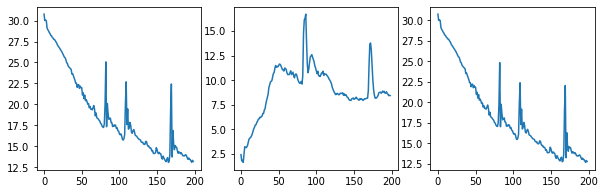

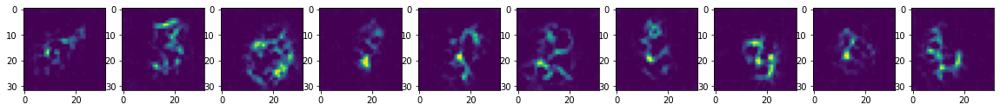

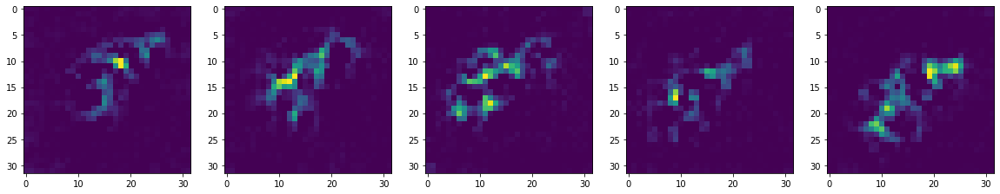

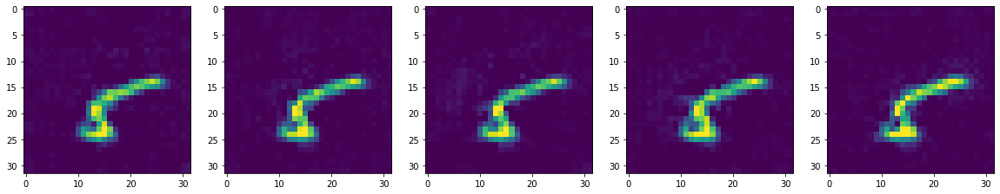

kl: tensor(6.0251, device='cuda:0') and tensor(9.6548, device='cuda:0')


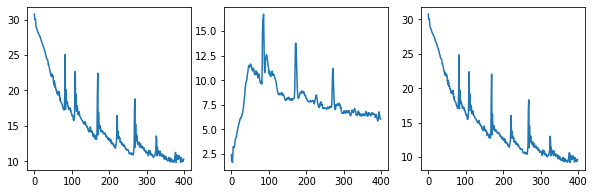

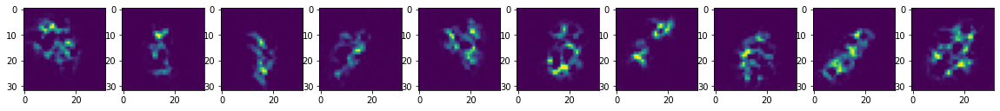

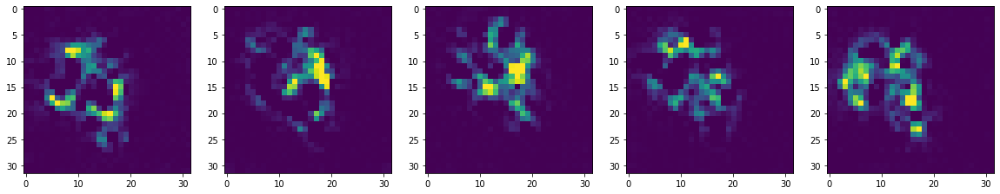

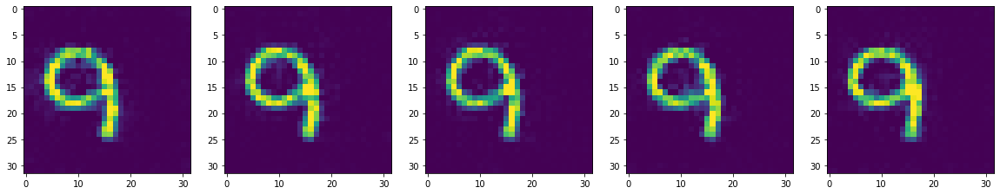

Epoch 1 Loss: 14.34


kl: tensor(5.3476, device='cuda:0') and tensor(8.0879, device='cuda:0')


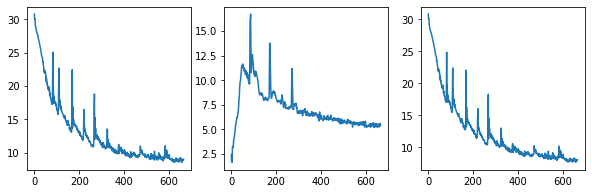

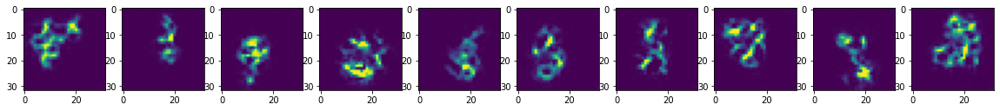

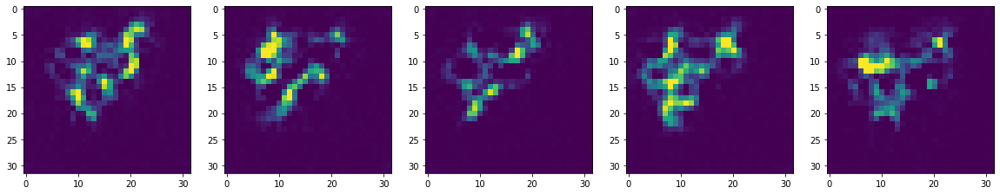

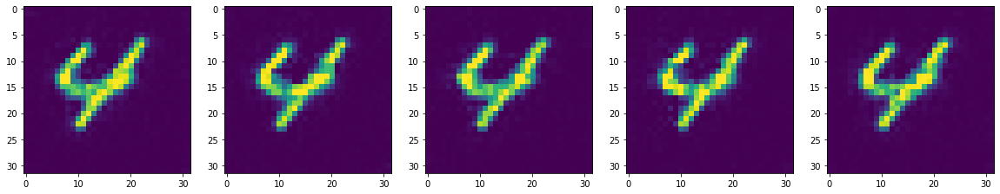

kl: tensor(4.9522, device='cuda:0') and tensor(7.1836, device='cuda:0')


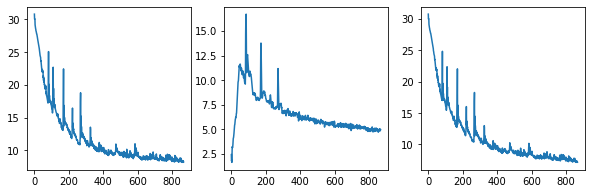

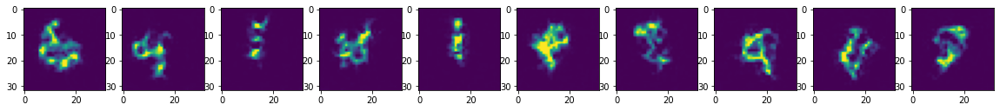

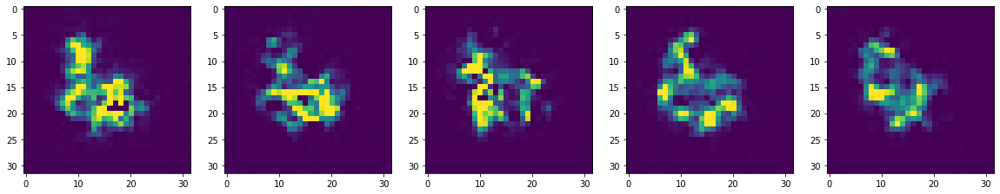

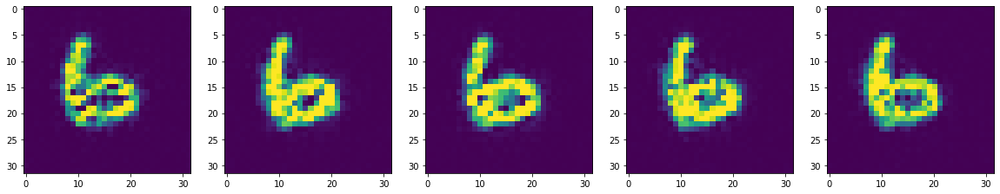

Epoch 2 Loss: 8.95


kl: tensor(4.3253, device='cuda:0') and tensor(7.0764, device='cuda:0')


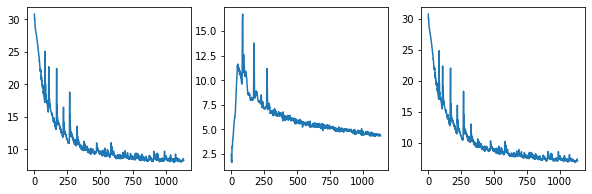

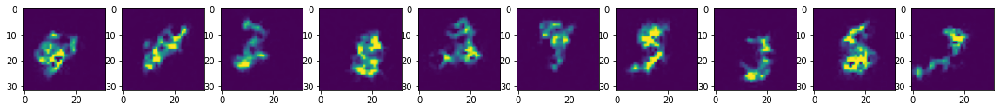

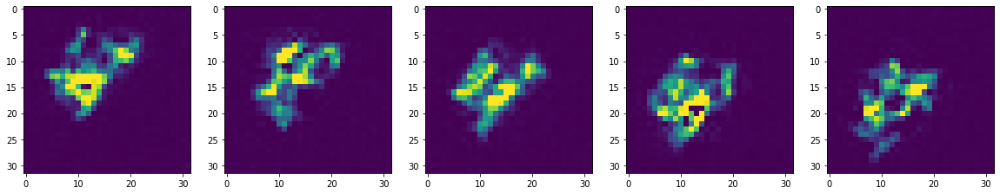

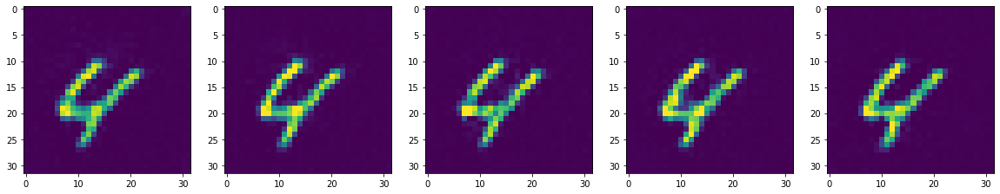

kl: tensor(3.9933, device='cuda:0') and tensor(6.8262, device='cuda:0')


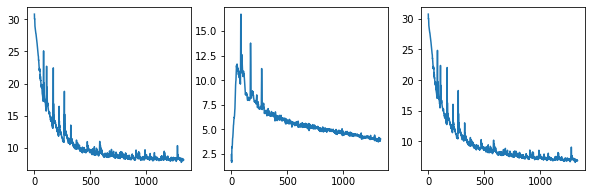

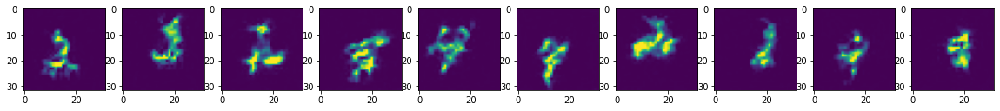

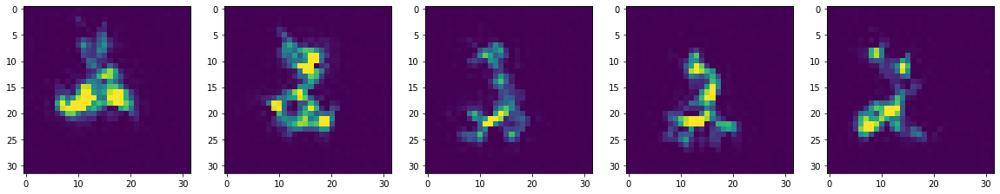

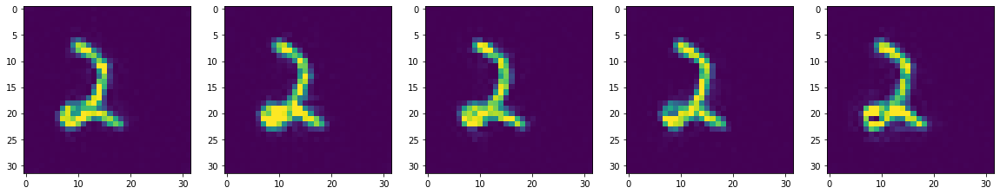

Epoch 3 Loss: 8.38


kl: tensor(3.4115, device='cuda:0') and tensor(6.8651, device='cuda:0')


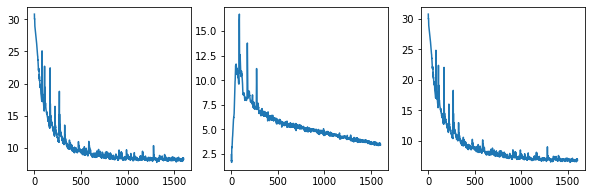

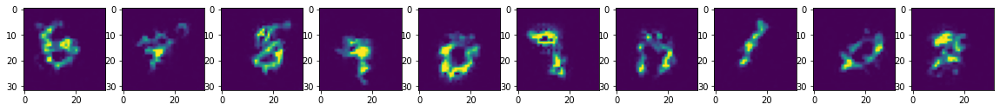

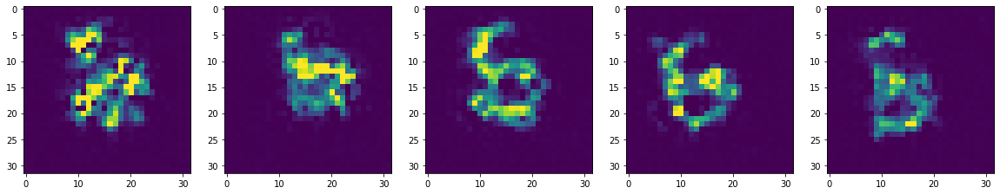

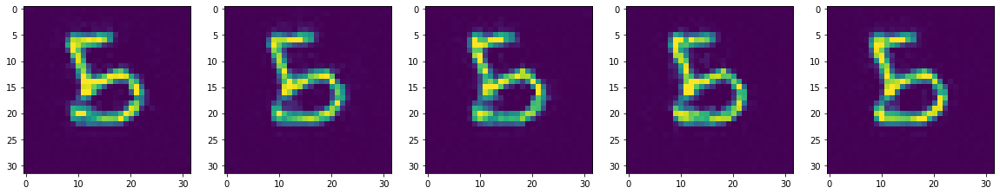

kl: tensor(3.1661, device='cuda:0') and tensor(6.6430, device='cuda:0')


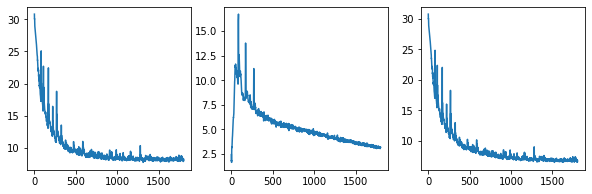

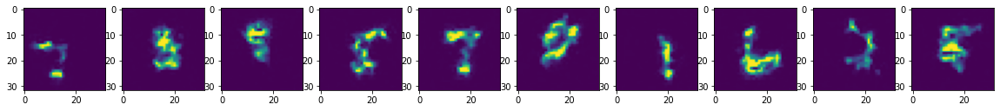

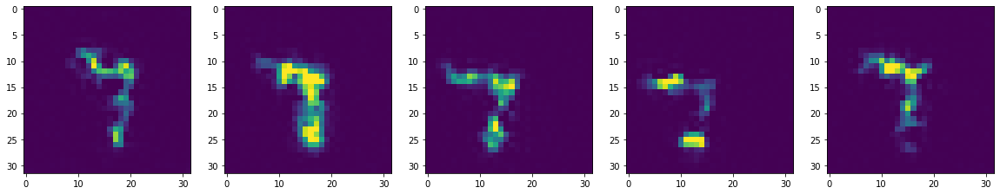

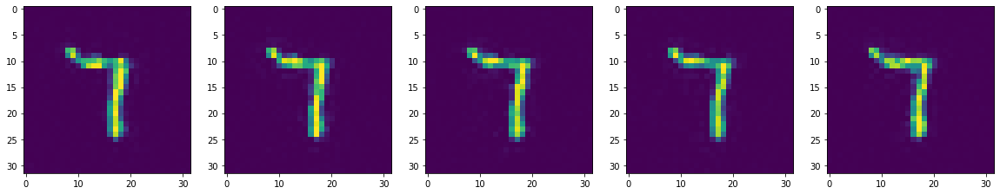

Epoch 4 Loss: 8.24


kl: tensor(2.7503, device='cuda:0') and tensor(6.9640, device='cuda:0')


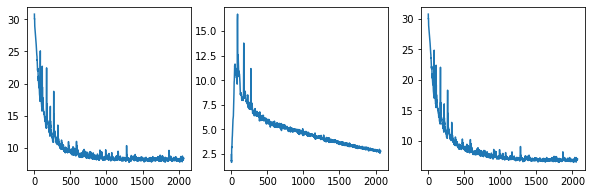

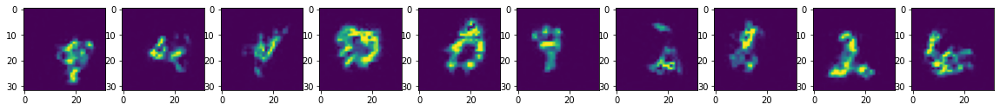

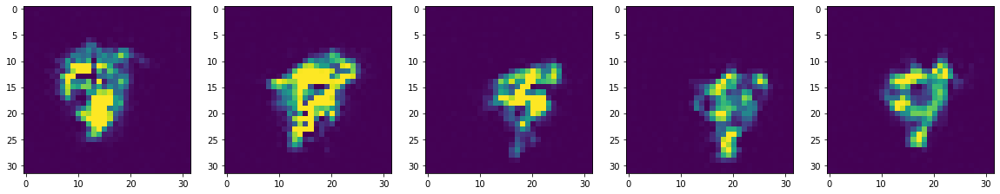

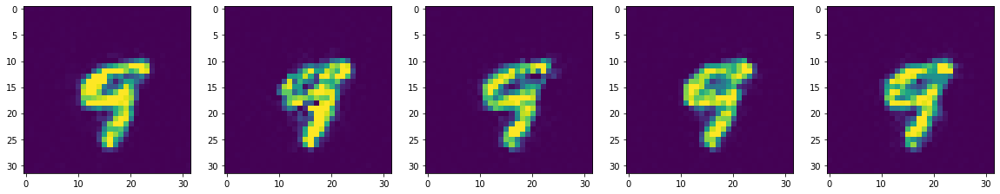

kl: tensor(2.4974, device='cuda:0') and tensor(6.8862, device='cuda:0')


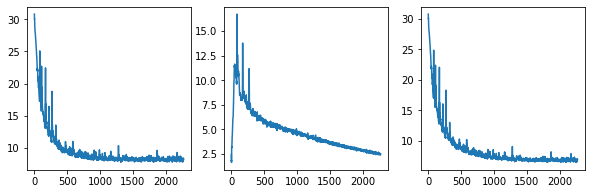

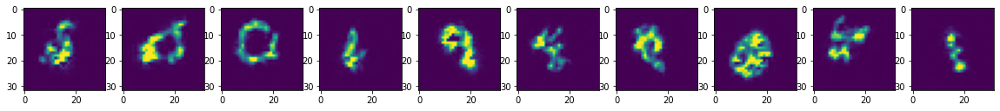

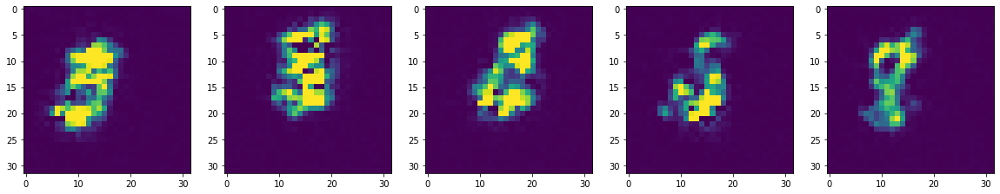

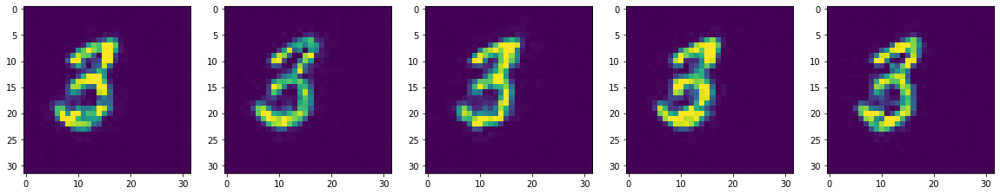

Epoch 5 Loss: 8.22


kl: tensor(2.1699, device='cuda:0') and tensor(6.7485, device='cuda:0')


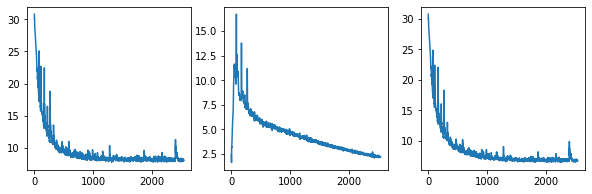

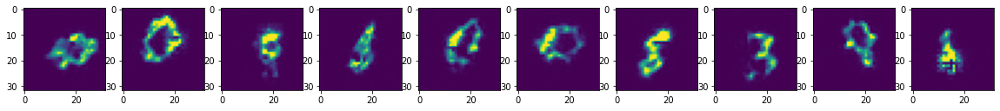

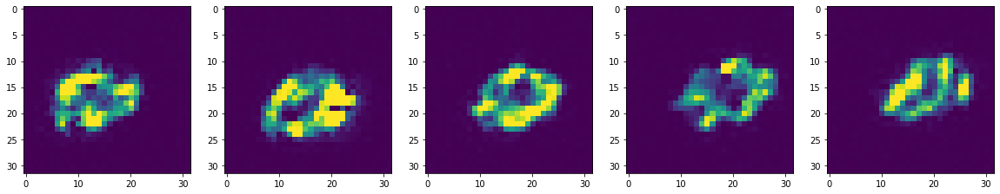

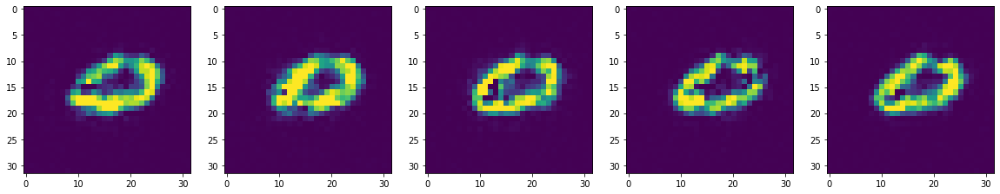

kl: tensor(1.8981, device='cuda:0') and tensor(6.6357, device='cuda:0')


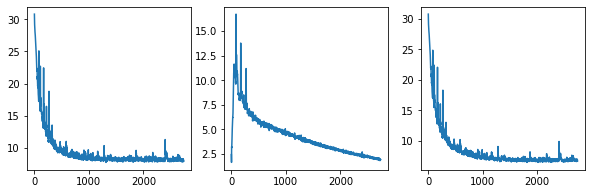

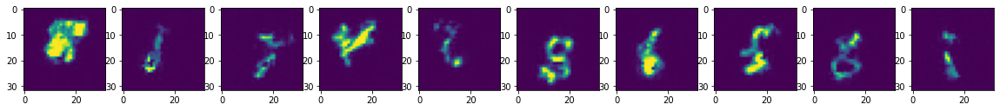

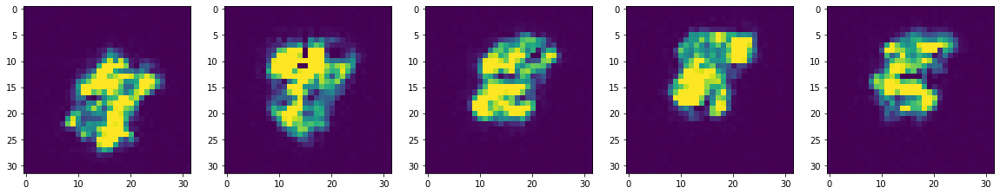

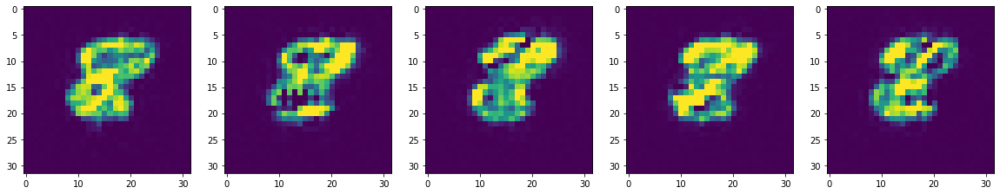

Epoch 6 Loss: 8.24


kl: tensor(1.6926, device='cuda:0') and tensor(7.0158, device='cuda:0')


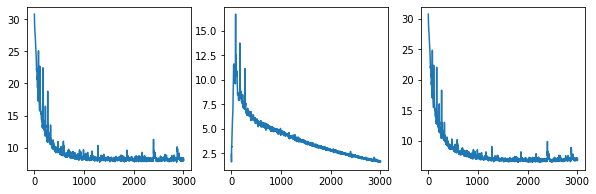

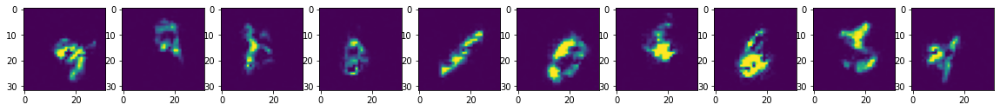

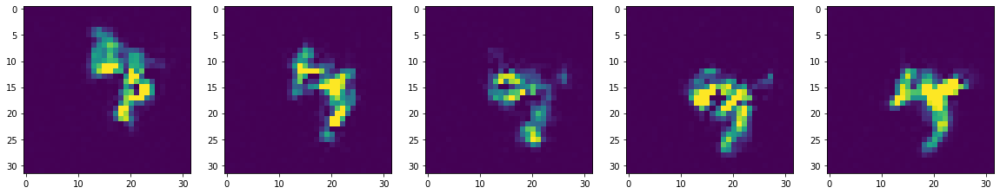

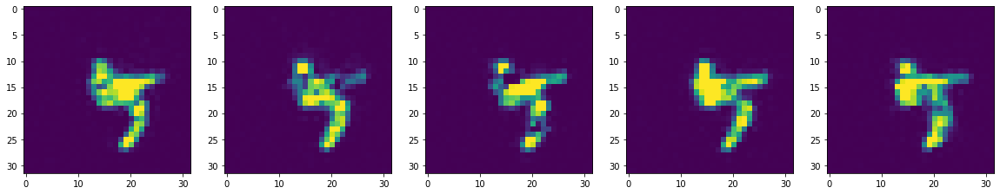

kl: tensor(1.4378, device='cuda:0') and tensor(7.3619, device='cuda:0')


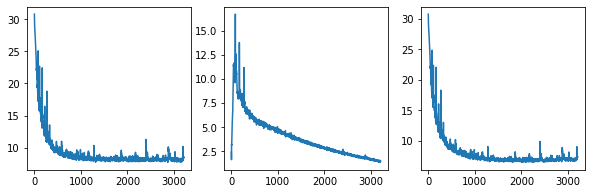

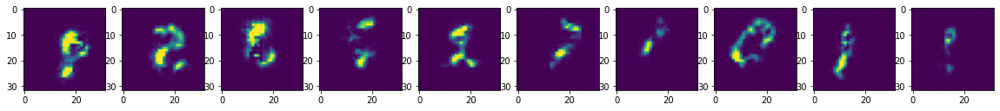

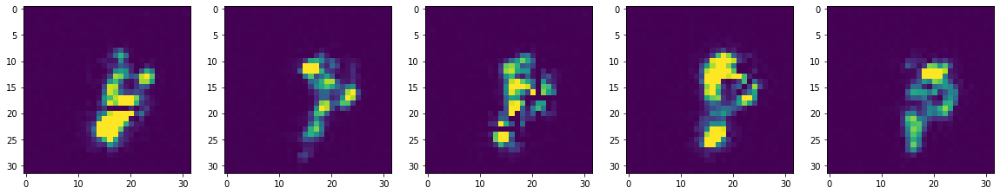

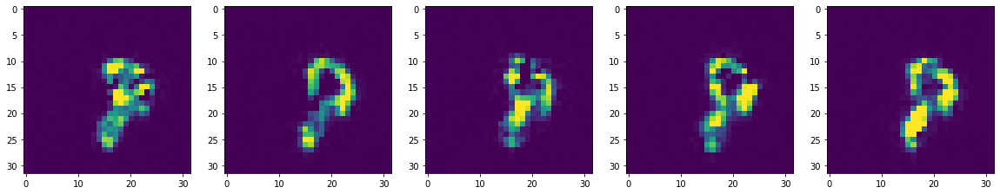

Epoch 7 Loss: 8.25


kl: tensor(1.1454, device='cuda:0') and tensor(6.9046, device='cuda:0')


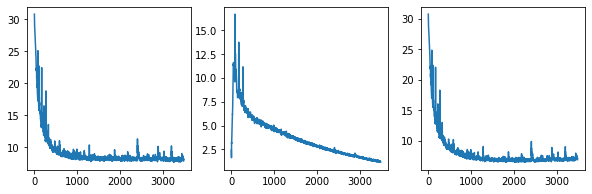

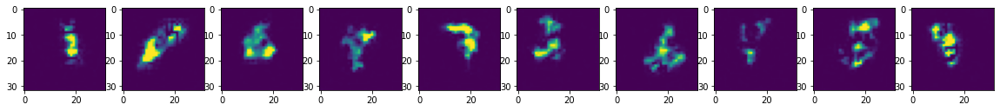

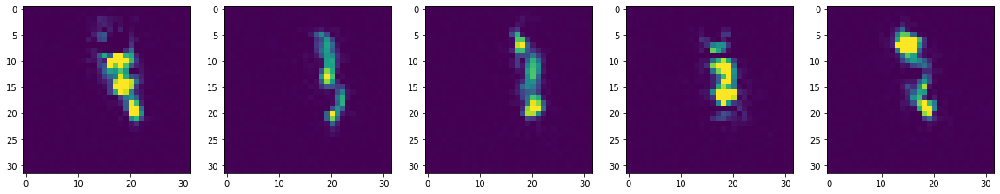

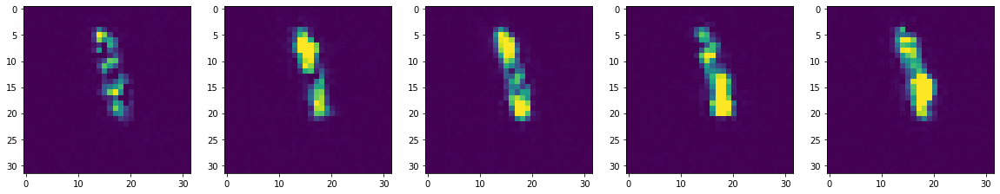

kl: tensor(0.9941, device='cuda:0') and tensor(7.2310, device='cuda:0')


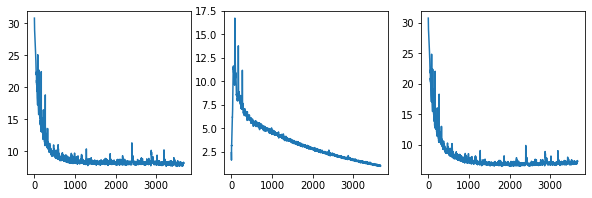

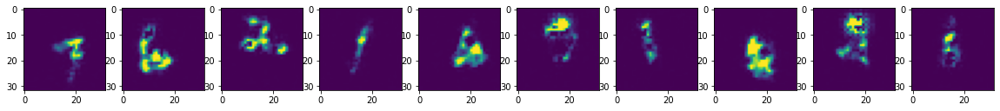

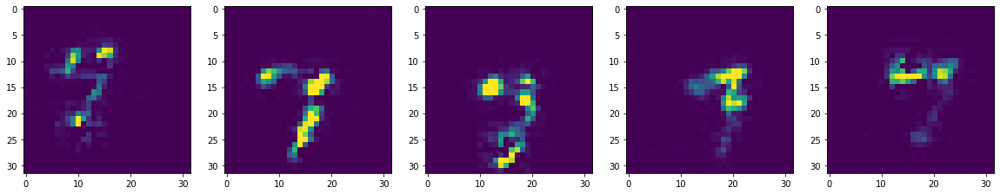

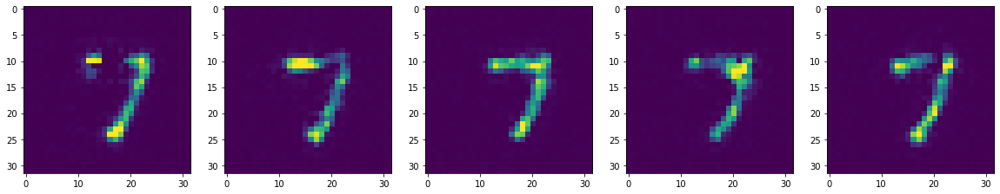

Epoch 8 Loss: 8.05


kl: tensor(0.7702, device='cuda:0') and tensor(7.0458, device='cuda:0')


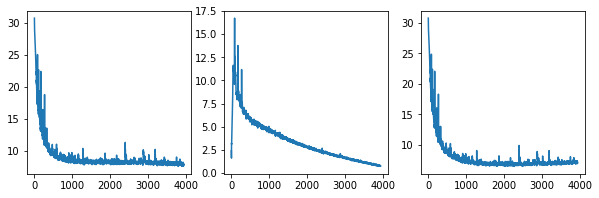

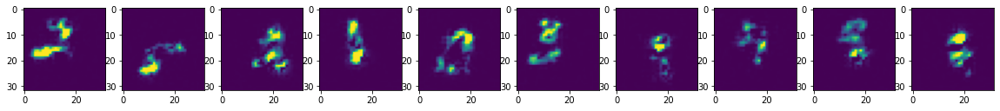

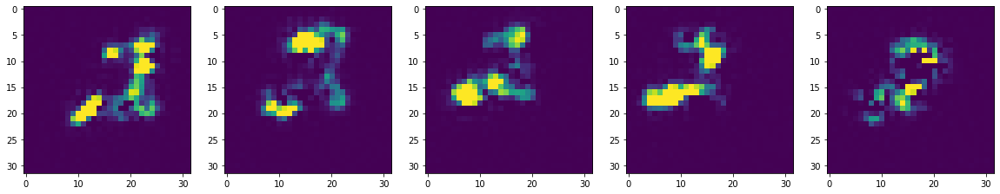

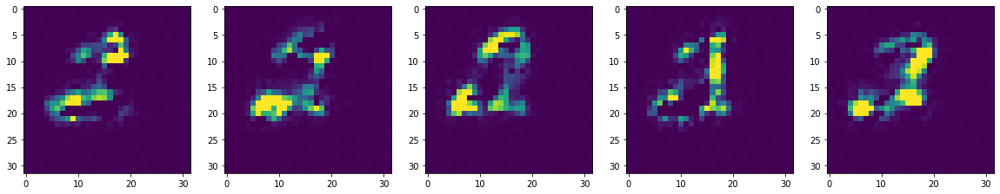

kl: tensor(0.5689, device='cuda:0') and tensor(7.1499, device='cuda:0')


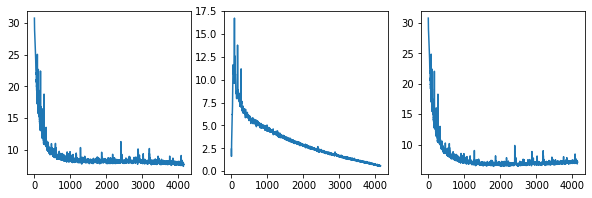

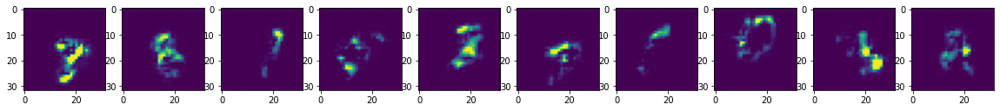

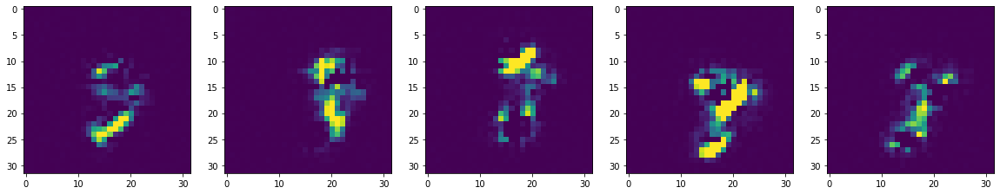

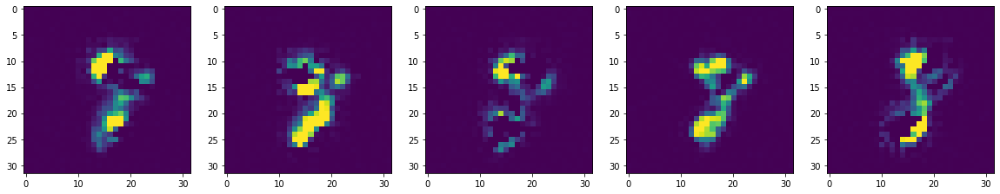

Epoch 9 Loss: 7.90


kl: tensor(0.3101, device='cuda:0') and tensor(7.2768, device='cuda:0')


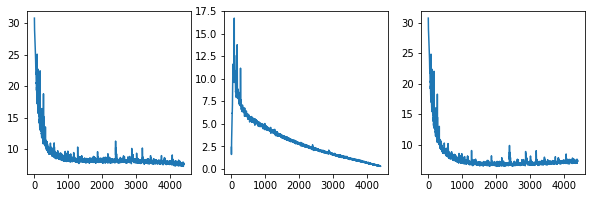

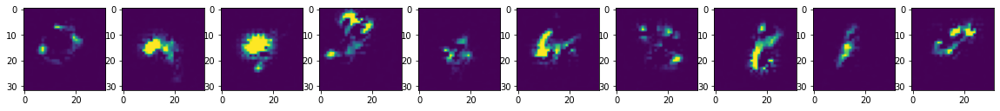

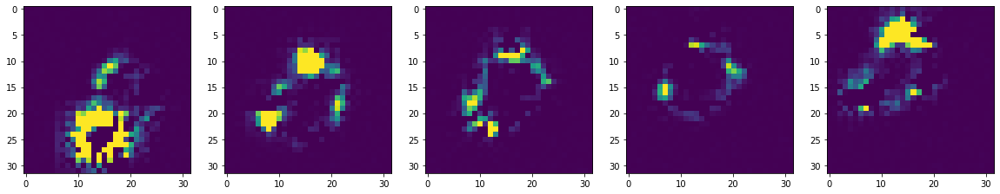

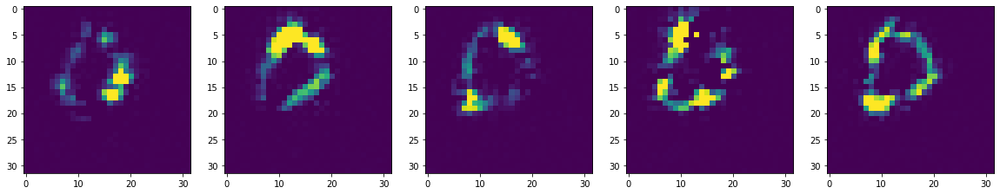

kl: tensor(0.2218, device='cuda:0') and tensor(7.3726, device='cuda:0')


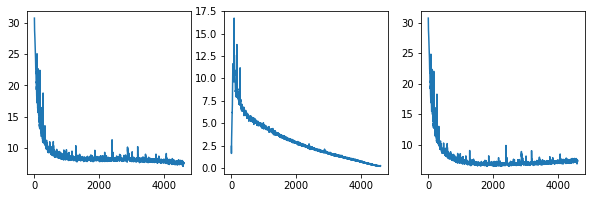

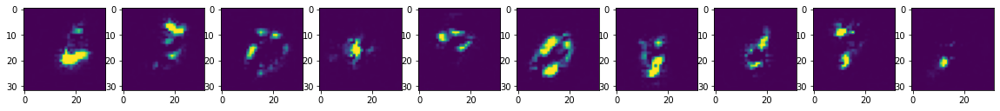

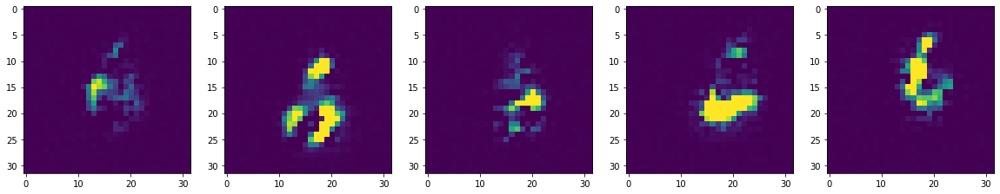

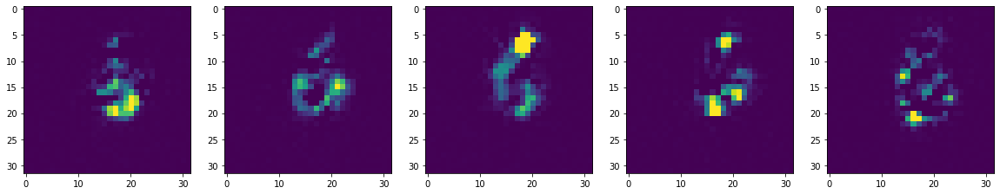

Epoch 10 Loss: 7.64


kl: tensor(0.1142, device='cuda:0') and tensor(7.1804, device='cuda:0')


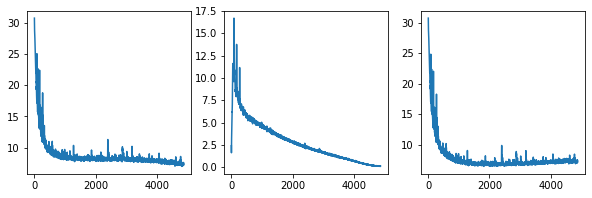

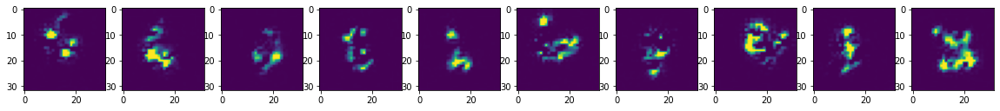

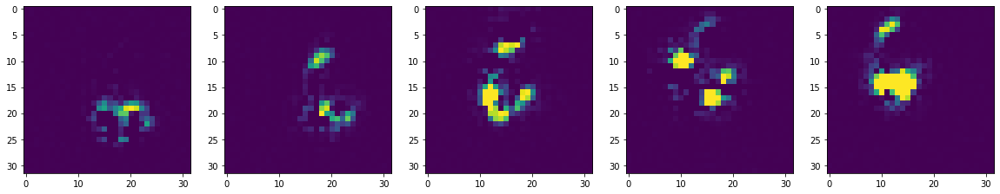

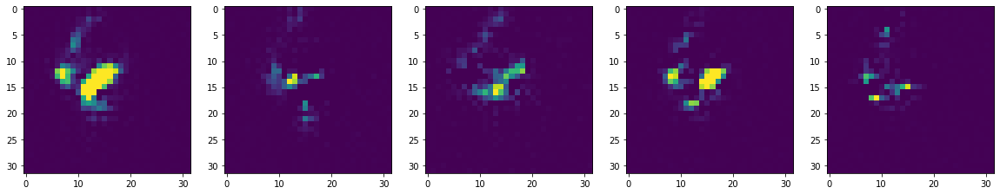

kl: tensor(0.0727, device='cuda:0') and tensor(7.0878, device='cuda:0')


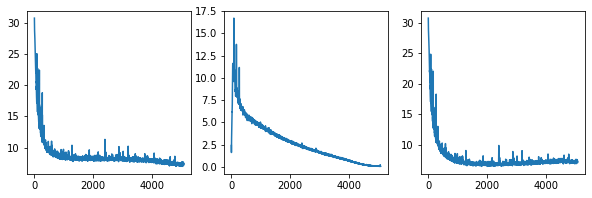

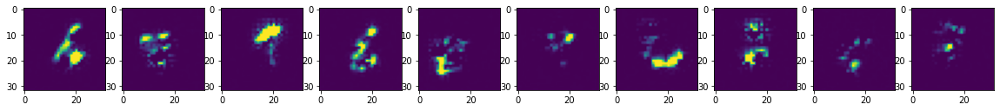

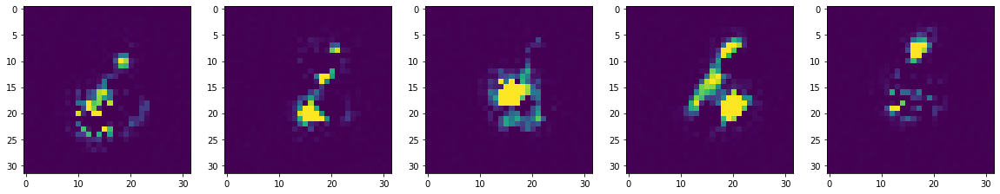

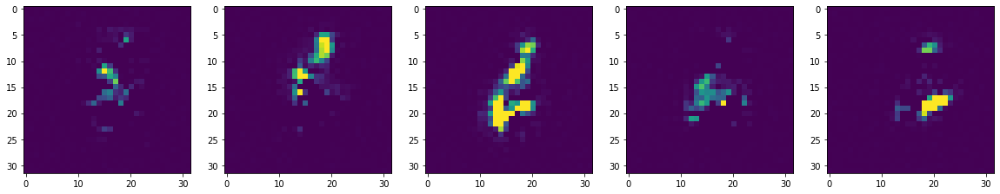

Epoch 11 Loss: 7.35


kl: tensor(0.0425, device='cuda:0') and tensor(6.9505, device='cuda:0')


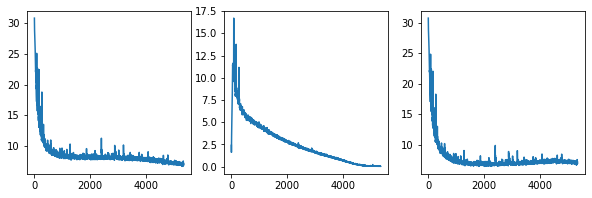

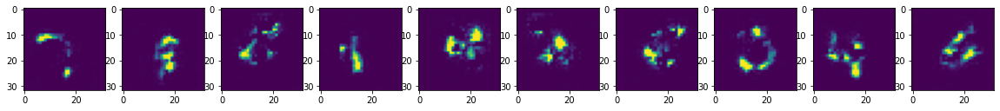

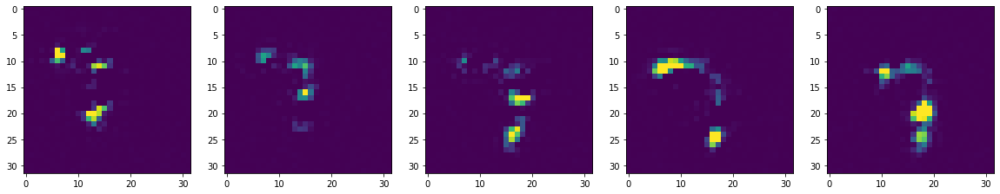

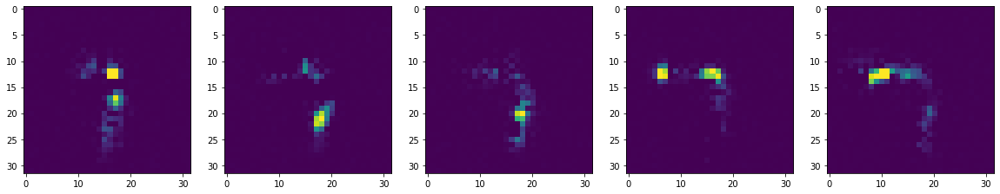

kl: tensor(0.0377, device='cuda:0') and tensor(6.8056, device='cuda:0')


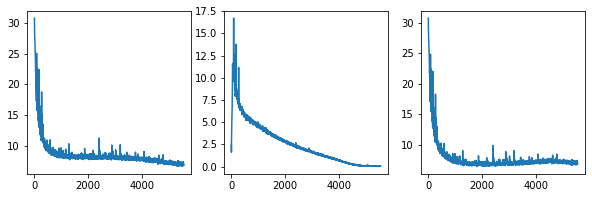

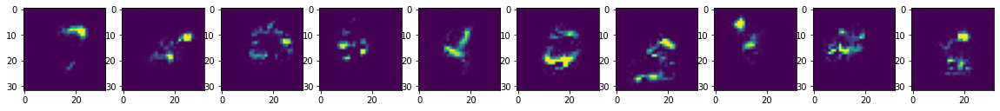

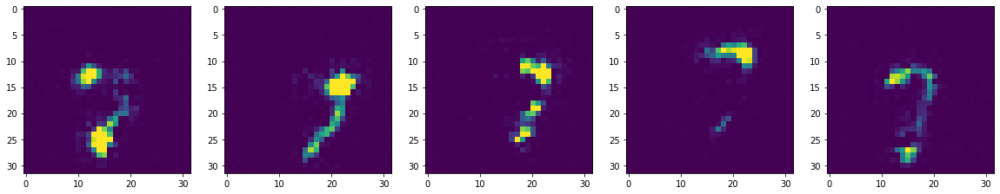

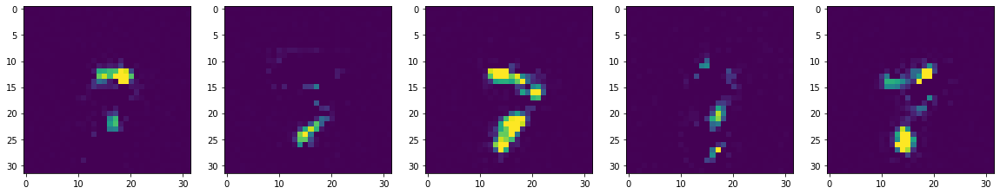

Epoch 12 Loss: 7.09


kl: tensor(0.0364, device='cuda:0') and tensor(7.0580, device='cuda:0')


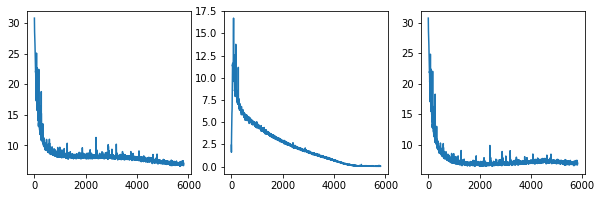

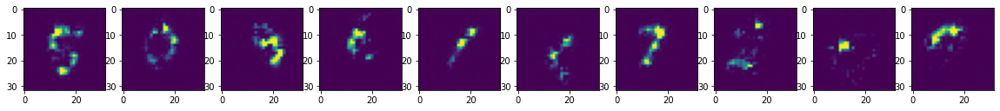

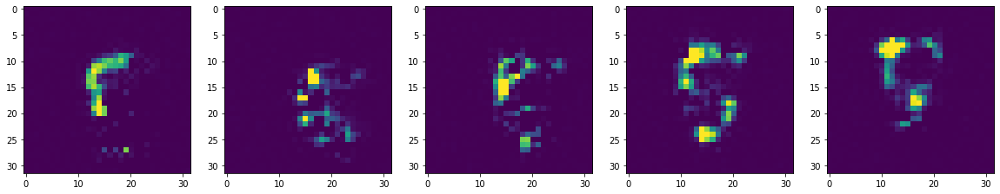

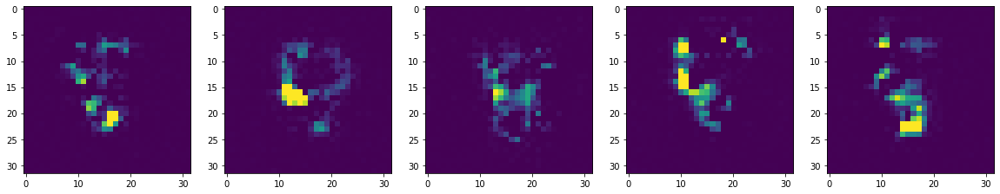

kl: tensor(0.0446, device='cuda:0') and tensor(6.7820, device='cuda:0')


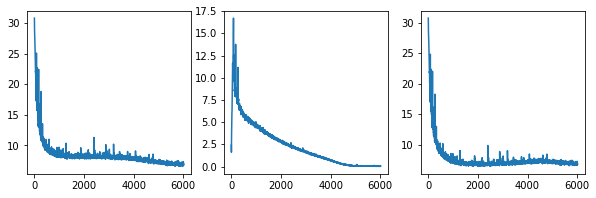

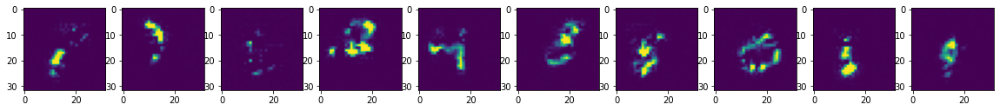

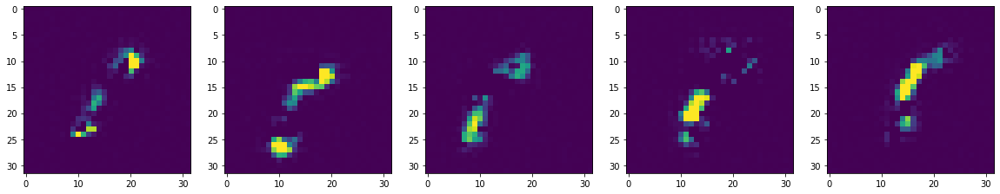

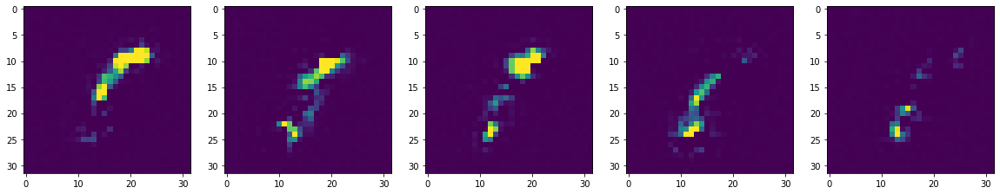

Epoch 13 Loss: 6.95


kl: tensor(0.0556, device='cuda:0') and tensor(6.8551, device='cuda:0')


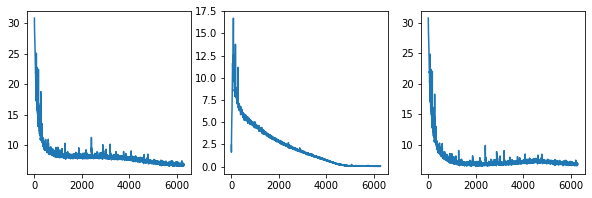

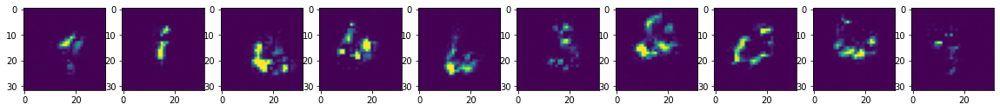

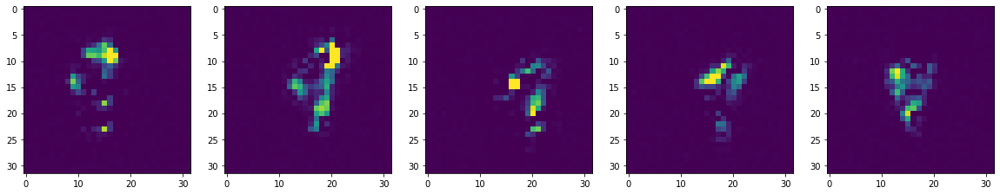

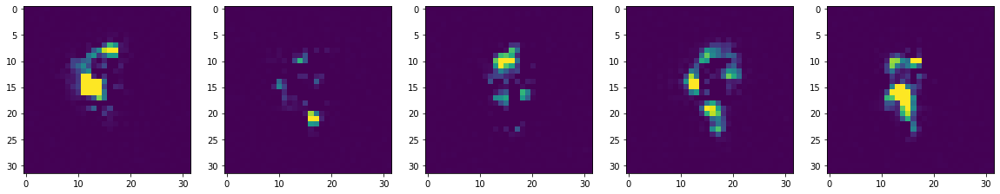

kl: tensor(0.0186, device='cuda:0') and tensor(6.6140, device='cuda:0')


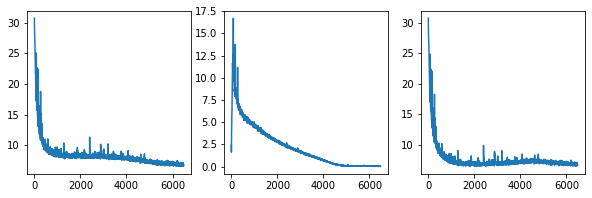

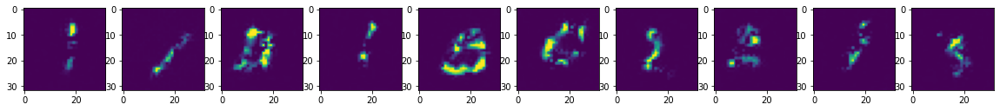

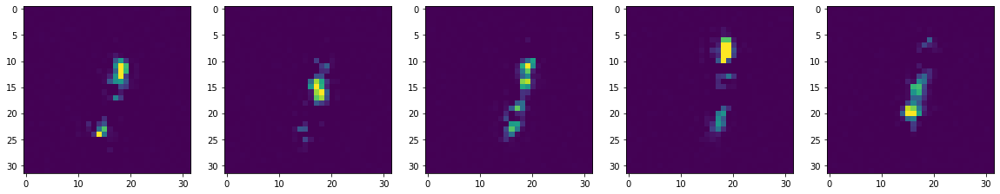

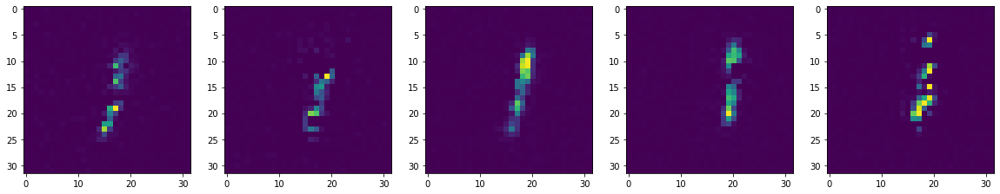

Epoch 14 Loss: 6.83


kl: tensor(0.0240, device='cuda:0') and tensor(6.6276, device='cuda:0')


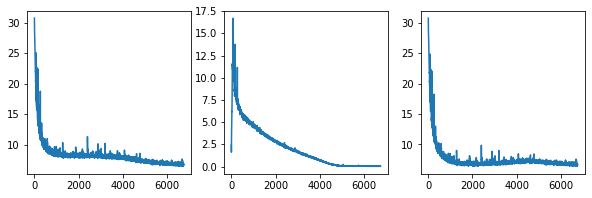

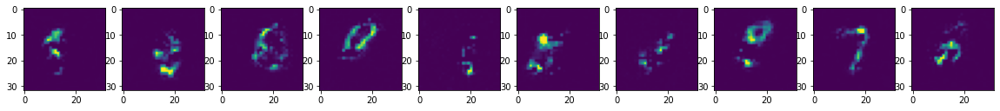

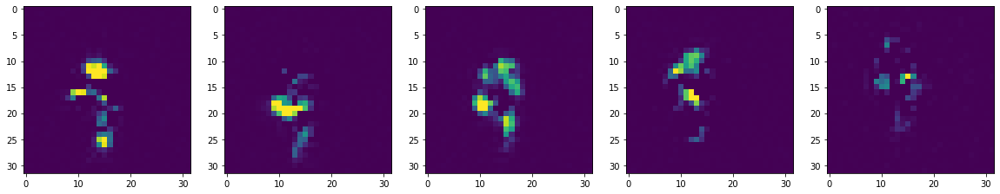

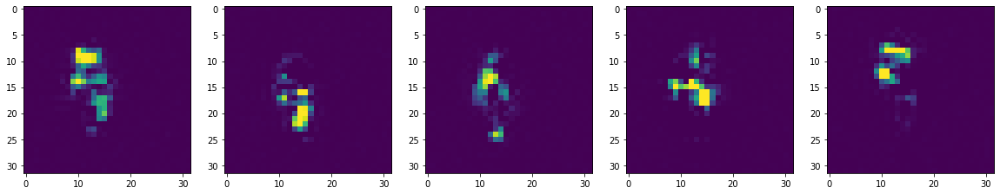

kl: tensor(0.0212, device='cuda:0') and tensor(6.8117, device='cuda:0')


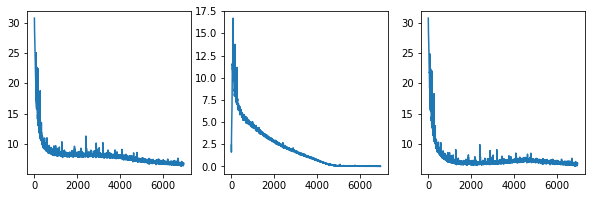

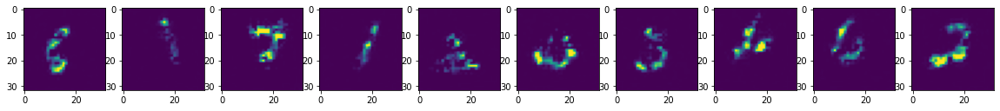

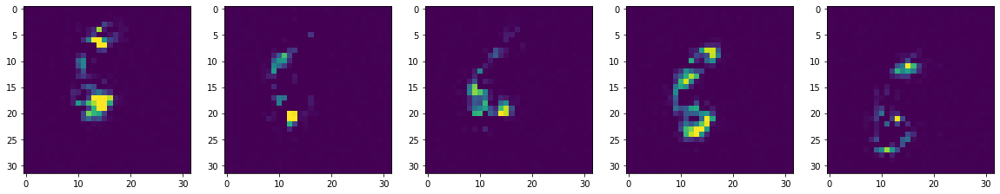

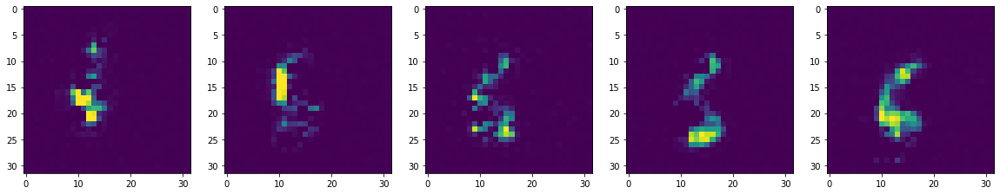

Epoch 15 Loss: 6.72


kl: tensor(0.0165, device='cuda:0') and tensor(6.6737, device='cuda:0')


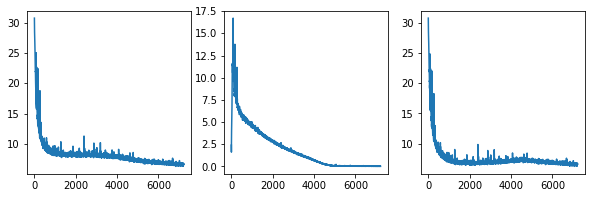

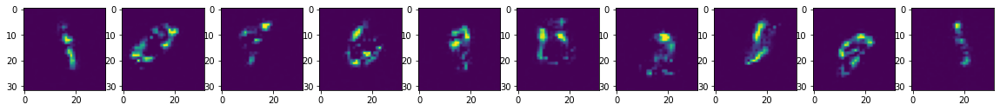

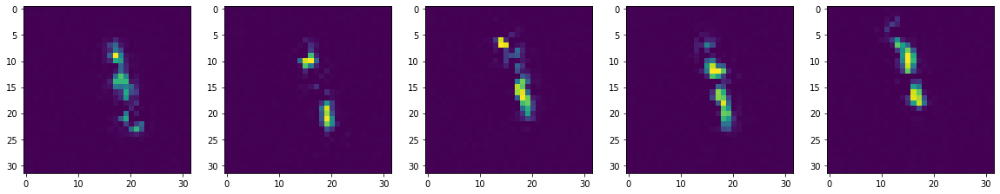

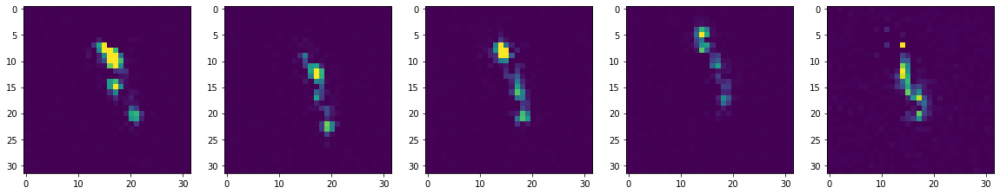

kl: tensor(0.0129, device='cuda:0') and tensor(6.5378, device='cuda:0')


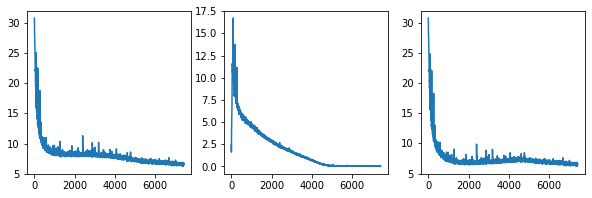

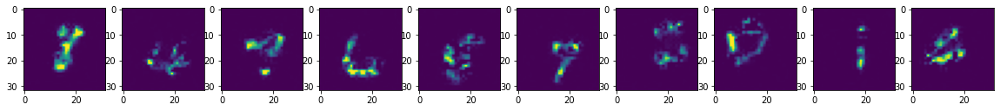

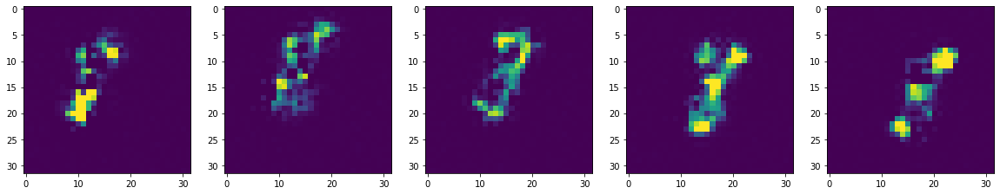

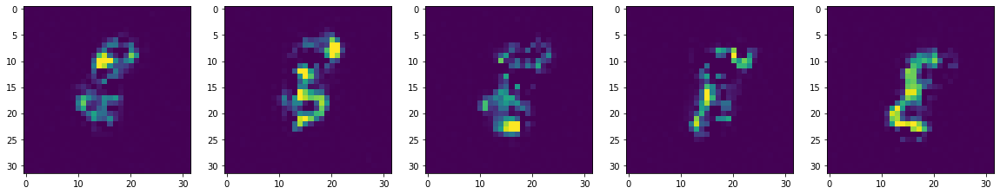

Epoch 16 Loss: 6.61


kl: tensor(0.0252, device='cuda:0') and tensor(6.3472, device='cuda:0')


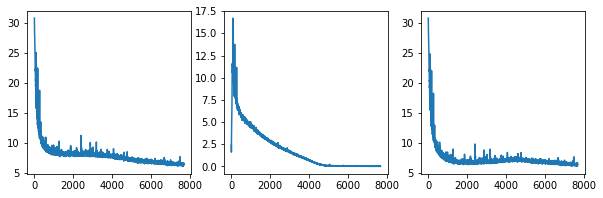

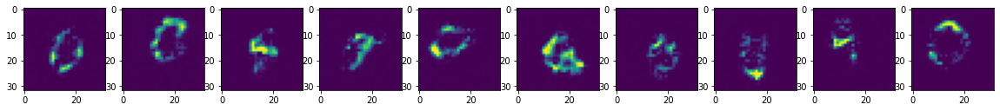

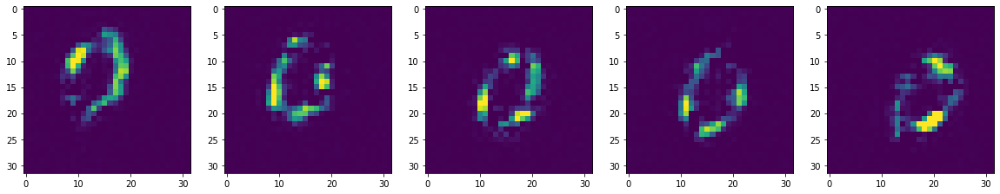

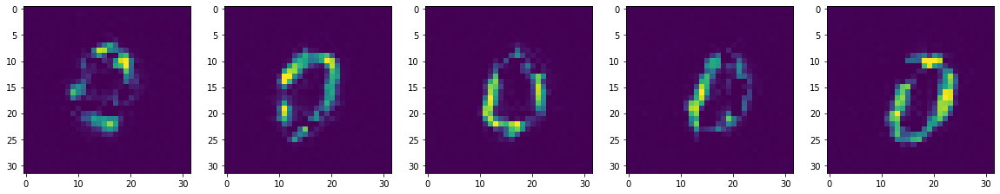

kl: tensor(0.0179, device='cuda:0') and tensor(6.6535, device='cuda:0')


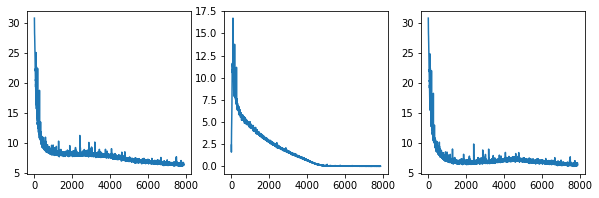

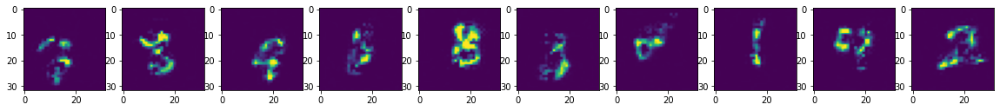

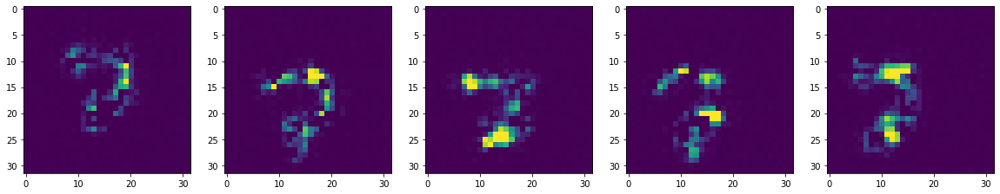

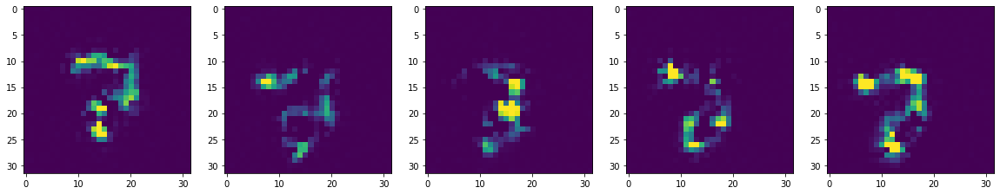

Epoch 17 Loss: 6.54


kl: tensor(0.0120, device='cuda:0') and tensor(6.4903, device='cuda:0')


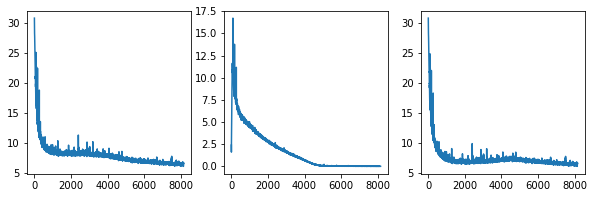

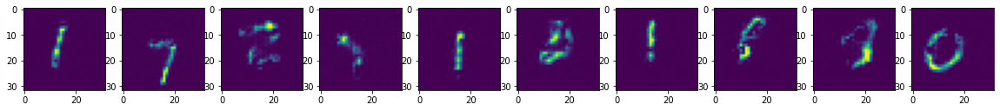

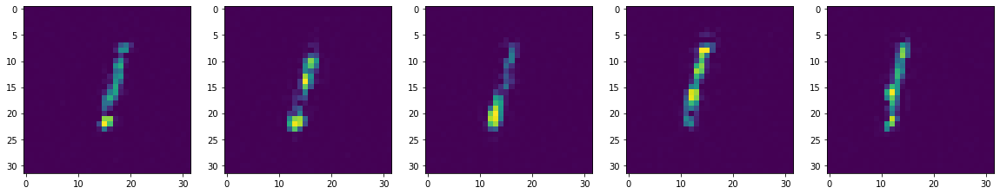

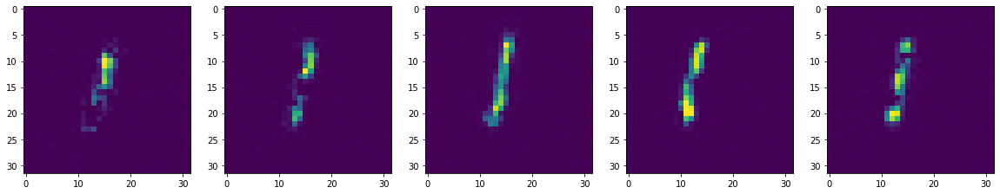

kl: tensor(0.0137, device='cuda:0') and tensor(6.2785, device='cuda:0')


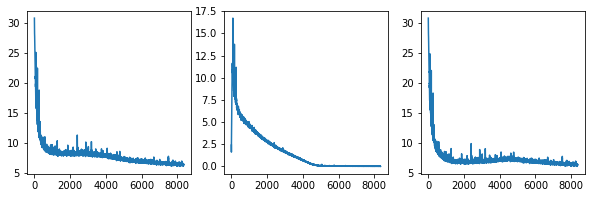

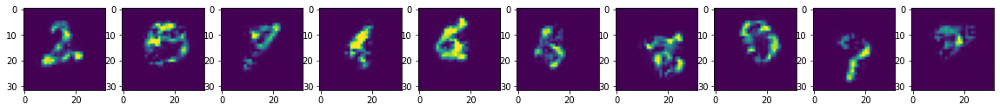

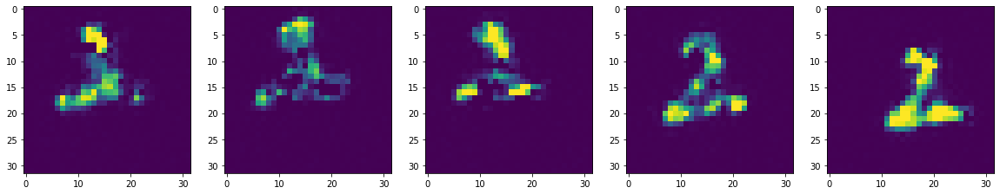

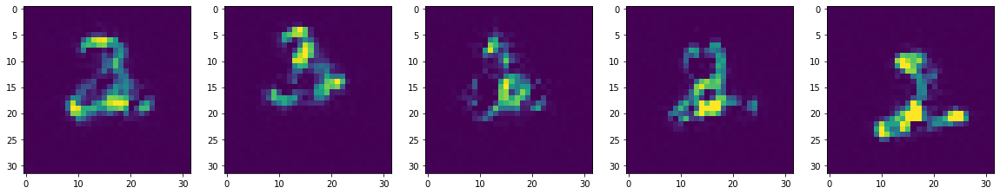

Epoch 18 Loss: 6.45


kl: tensor(0.0130, device='cuda:0') and tensor(6.3640, device='cuda:0')


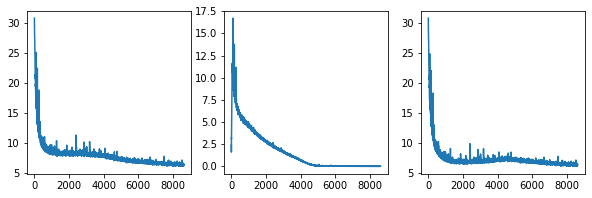

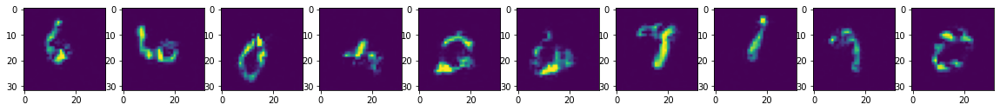

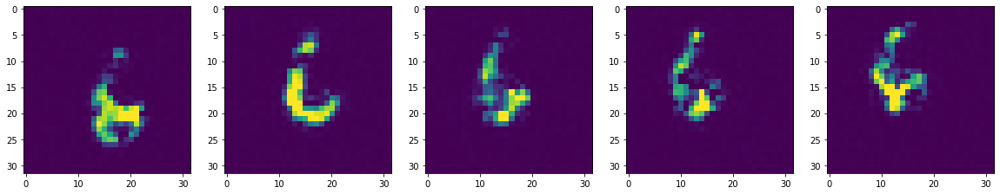

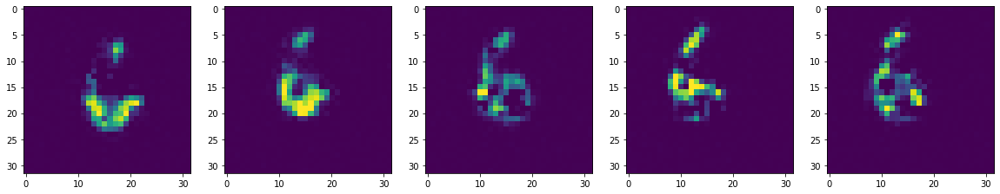

kl: tensor(0.0125, device='cuda:0') and tensor(6.0921, device='cuda:0')


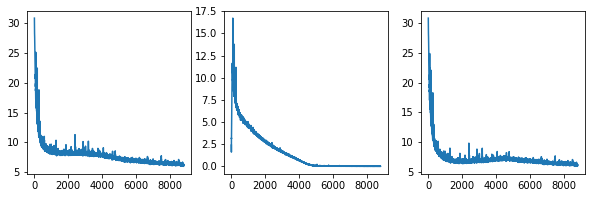

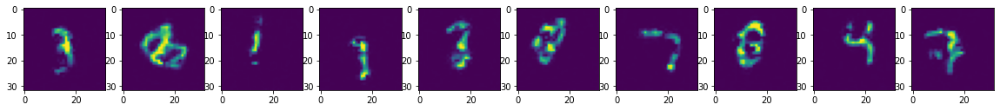

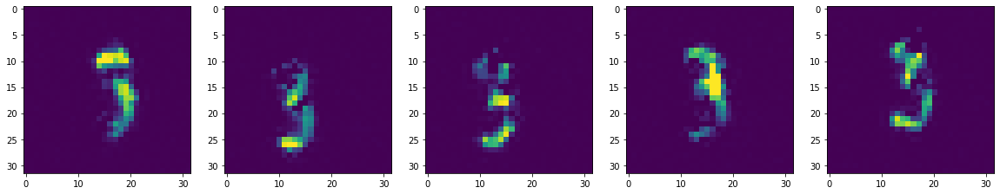

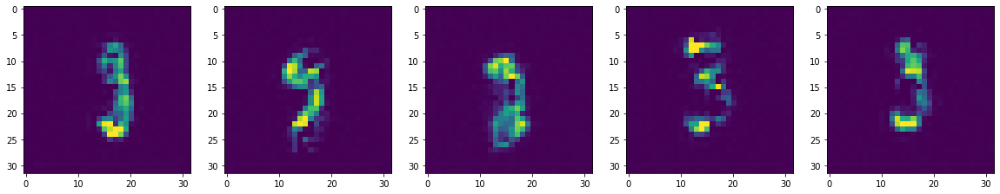

Epoch 19 Loss: 6.36


kl: tensor(0.0104, device='cuda:0') and tensor(6.2231, device='cuda:0')


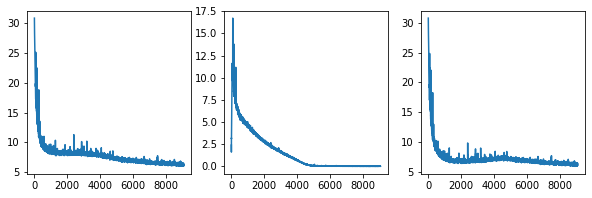

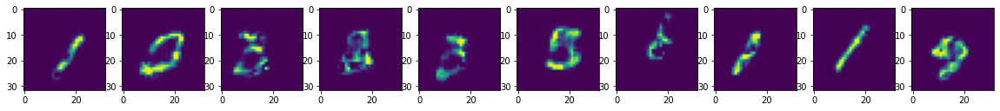

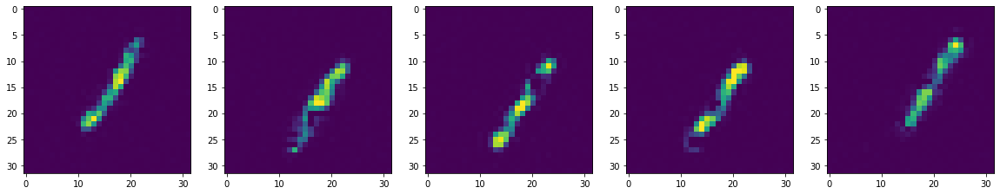

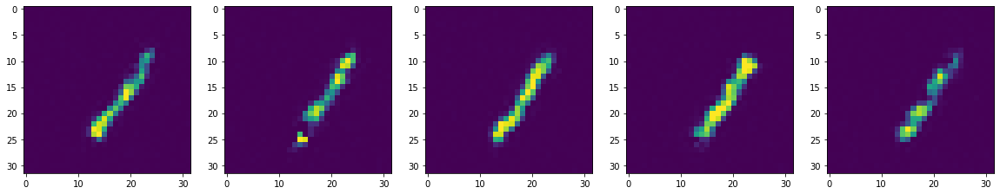

kl: tensor(0.0212, device='cuda:0') and tensor(6.2366, device='cuda:0')


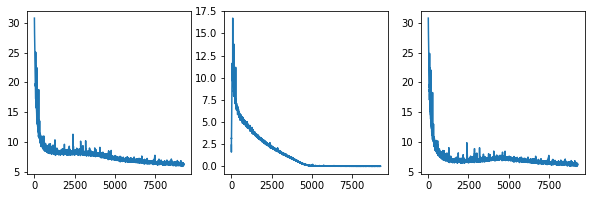

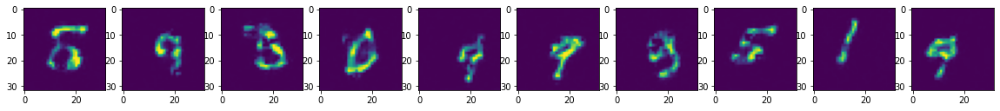

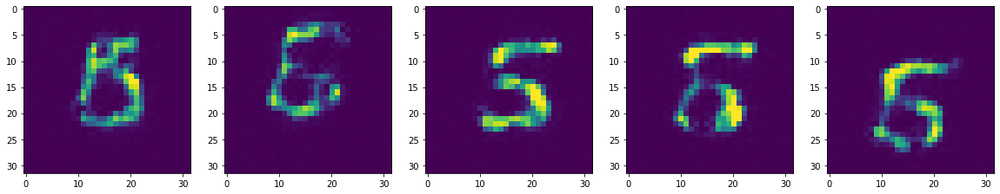

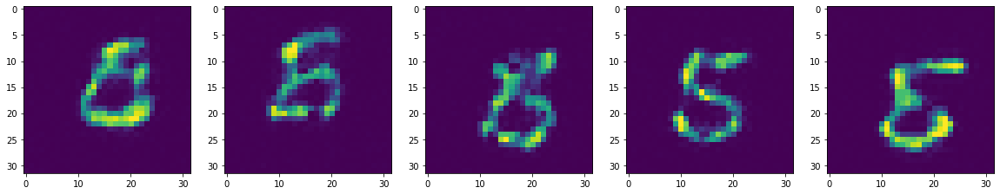

Epoch 20 Loss: 6.30


kl: tensor(0.0105, device='cuda:0') and tensor(6.3536, device='cuda:0')


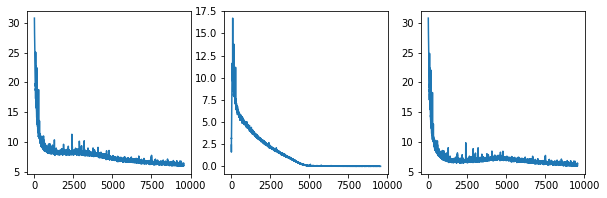

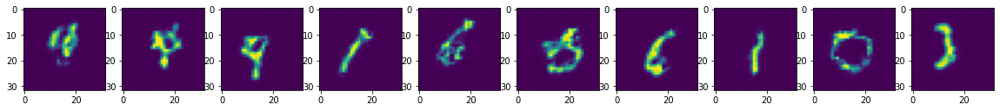

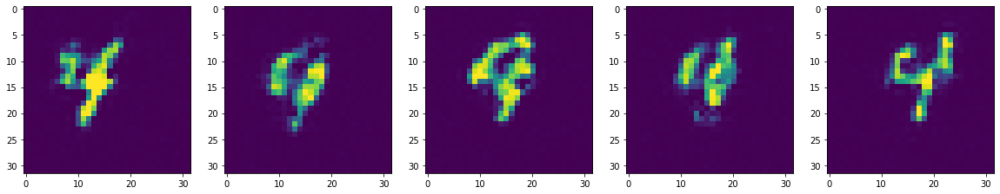

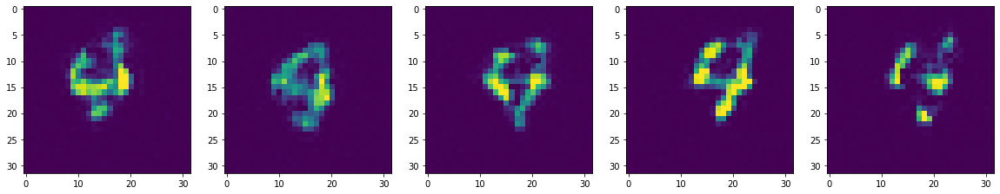

kl: tensor(0.0086, device='cuda:0') and tensor(5.9426, device='cuda:0')


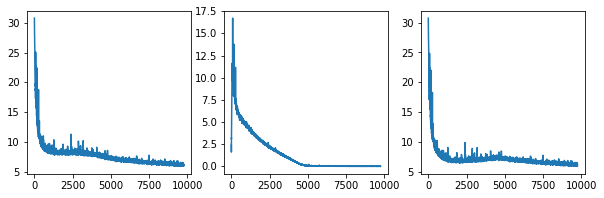

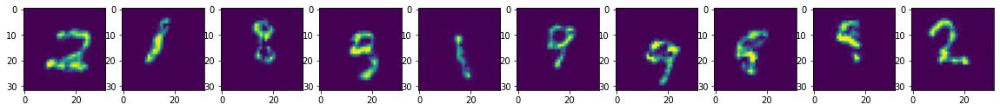

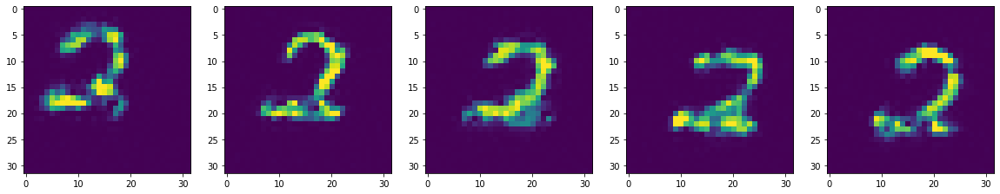

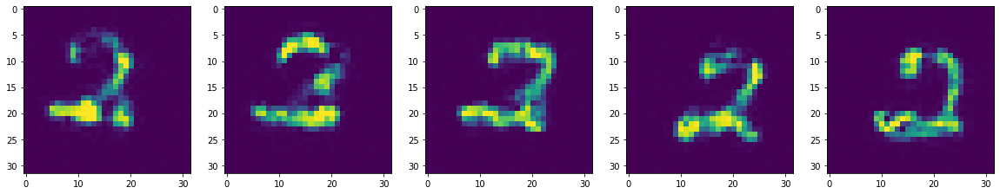

Epoch 21 Loss: 6.20


kl: tensor(0.0321, device='cuda:0') and tensor(6.1768, device='cuda:0')


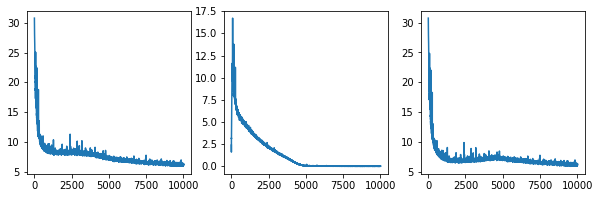

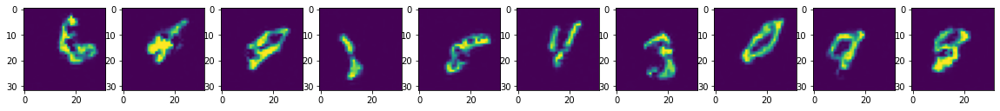

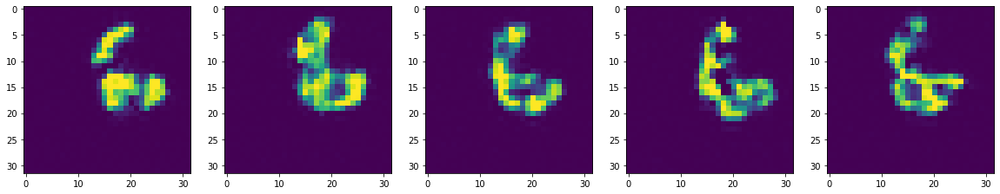

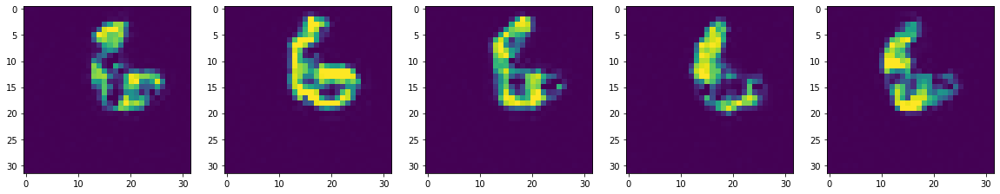

kl: tensor(0.0227, device='cuda:0') and tensor(6.2028, device='cuda:0')


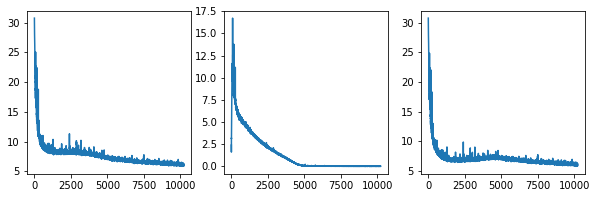

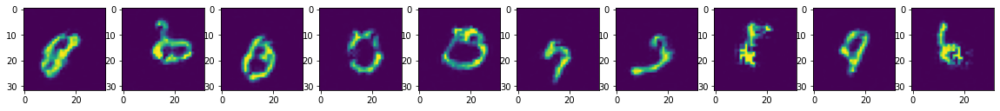

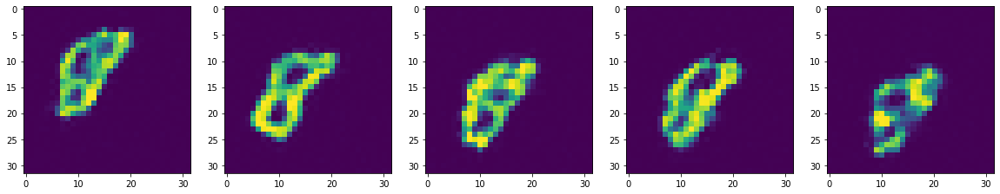

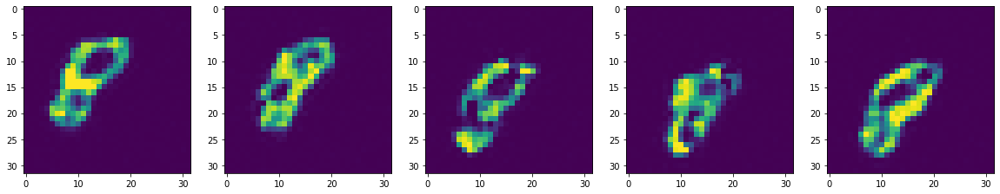

Epoch 22 Loss: 6.14


kl: tensor(0.0105, device='cuda:0') and tensor(6.0006, device='cuda:0')


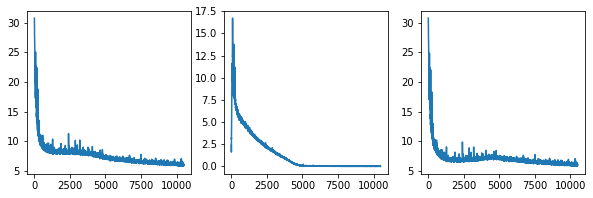

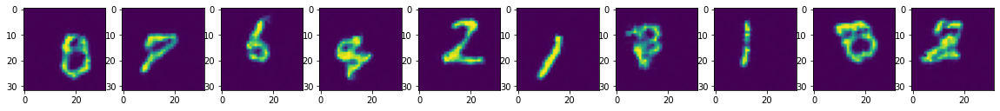

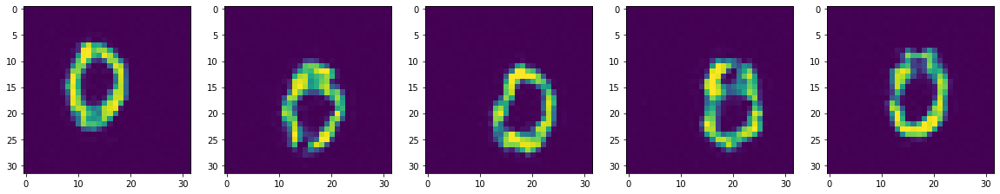

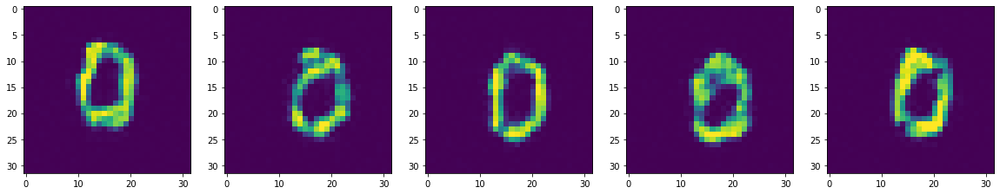

kl: tensor(0.0123, device='cuda:0') and tensor(5.8261, device='cuda:0')


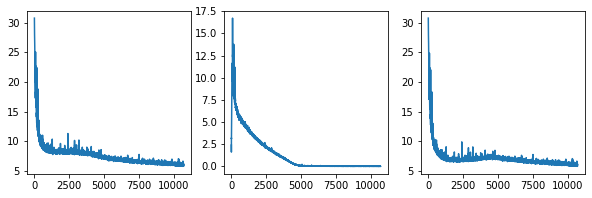

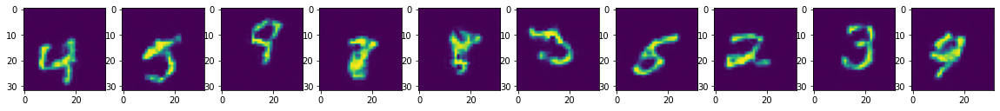

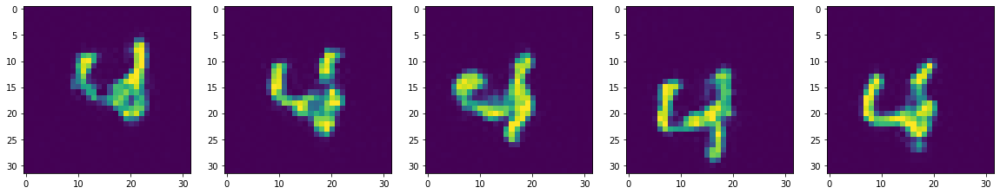

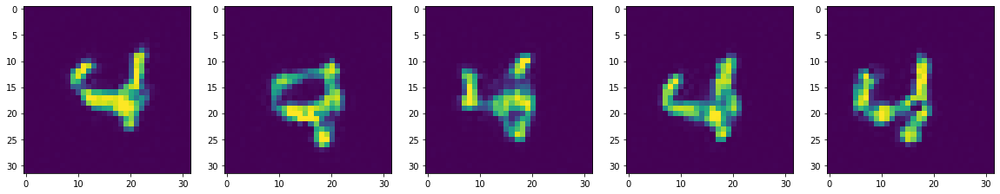

Epoch 23 Loss: 6.08


kl: tensor(0.0118, device='cuda:0') and tensor(6.0699, device='cuda:0')


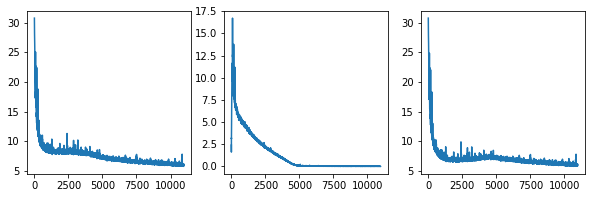

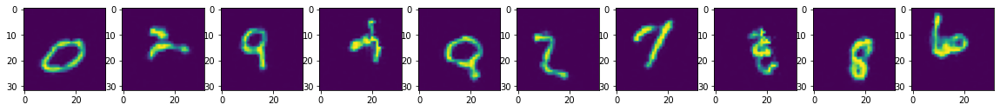

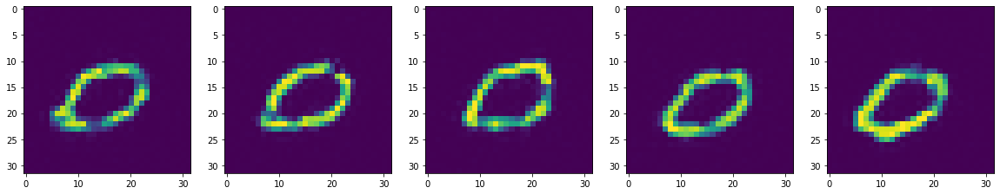

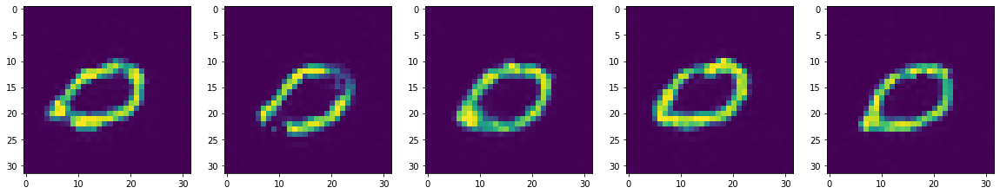

kl: tensor(0.0127, device='cuda:0') and tensor(5.9385, device='cuda:0')


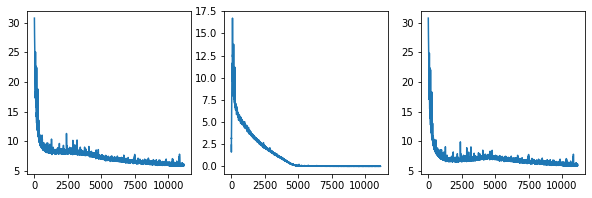

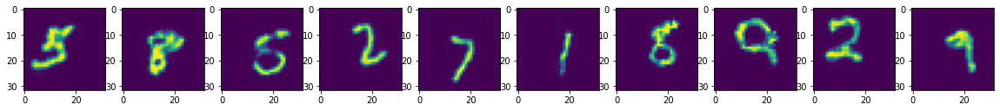

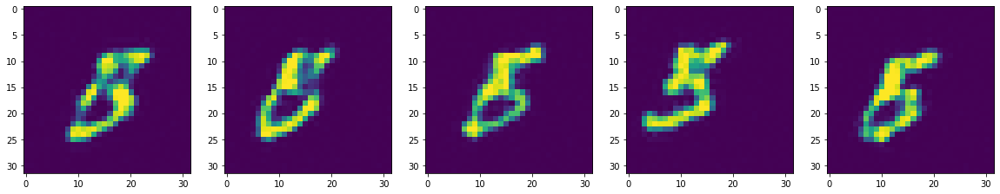

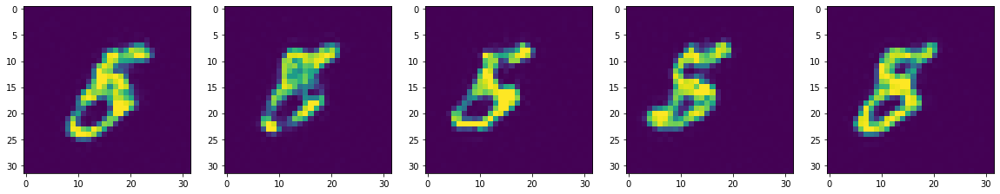

Epoch 24 Loss: 6.05


kl: tensor(0.0379, device='cuda:0') and tensor(6.0272, device='cuda:0')


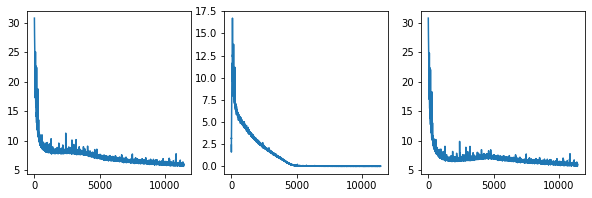

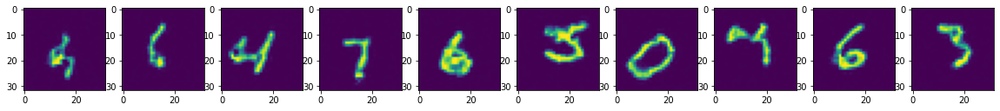

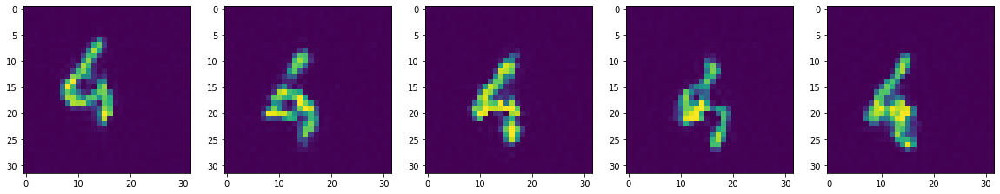

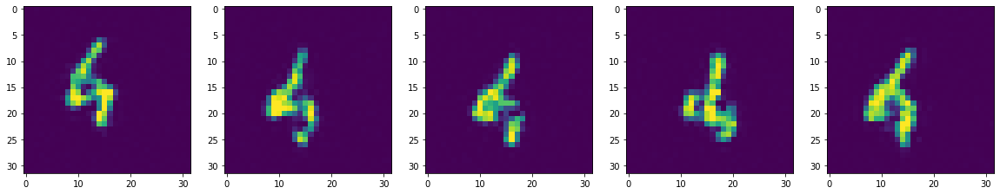

kl: tensor(0.0066, device='cuda:0') and tensor(5.9309, device='cuda:0')


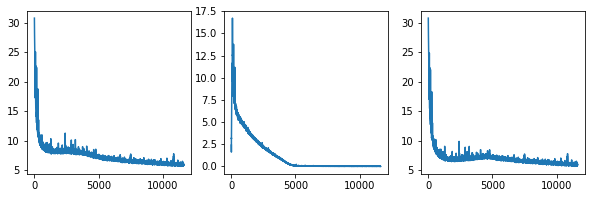

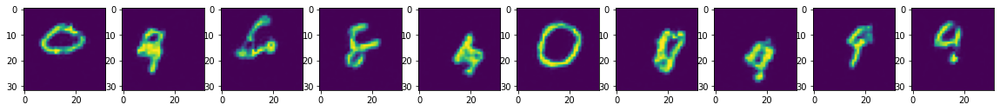

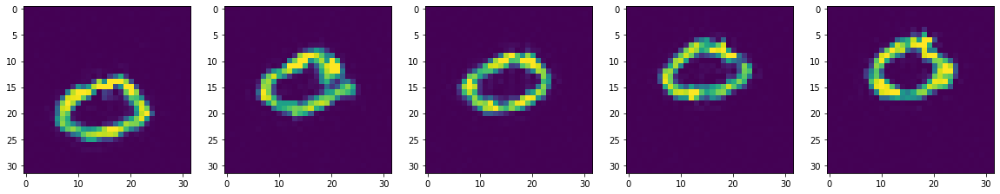

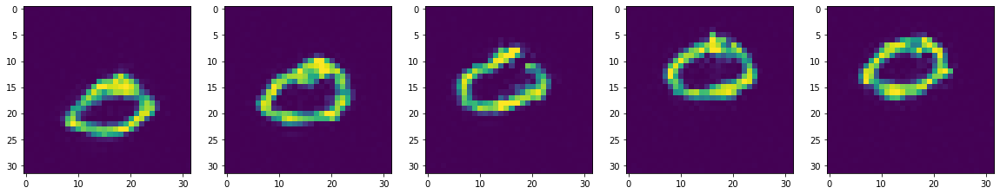

Epoch 25 Loss: 5.96


kl: tensor(0.0067, device='cuda:0') and tensor(5.9829, device='cuda:0')


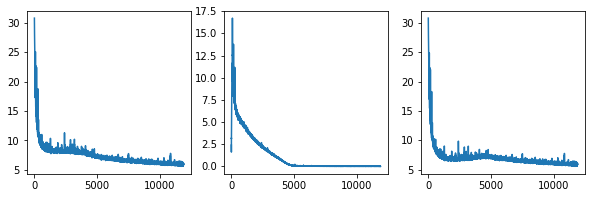

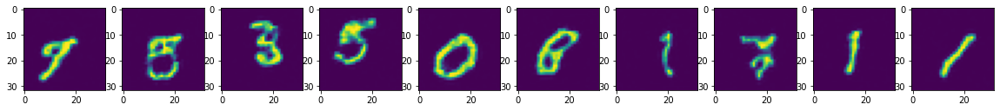

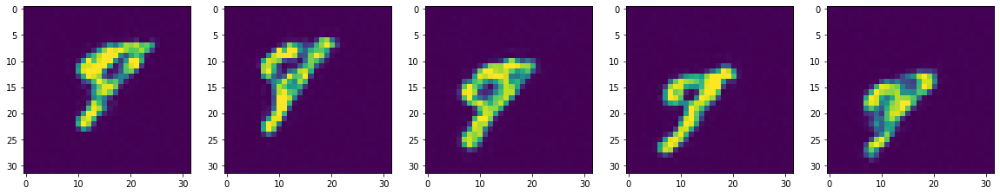

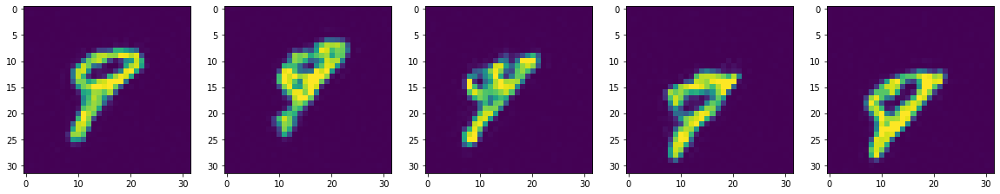

kl: tensor(0.0109, device='cuda:0') and tensor(6.0944, device='cuda:0')


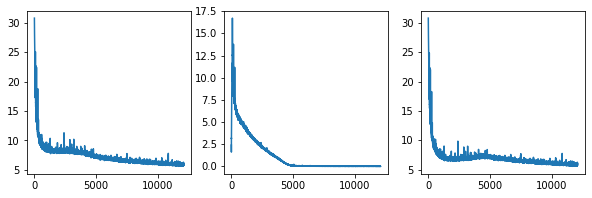

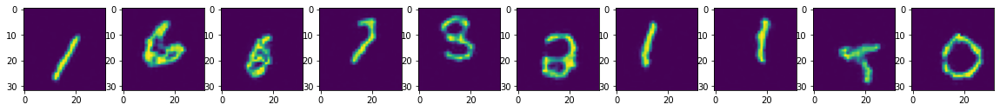

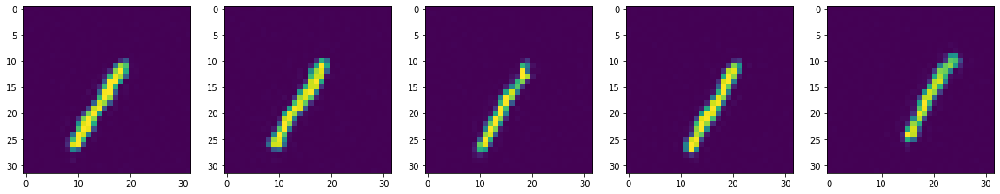

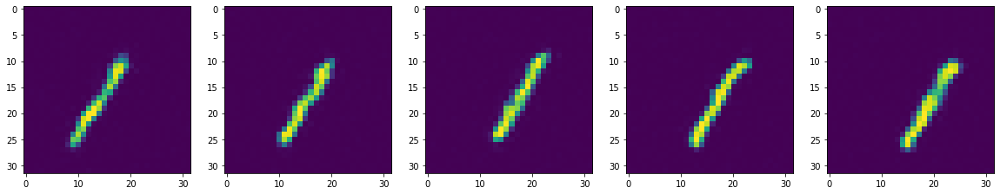

Epoch 26 Loss: 5.91


kl: tensor(0.0142, device='cuda:0') and tensor(5.8240, device='cuda:0')


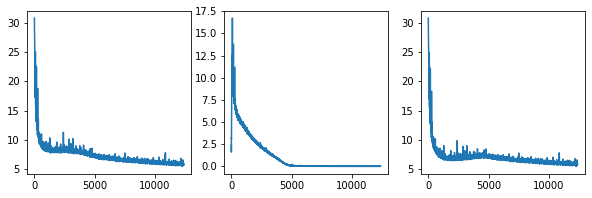

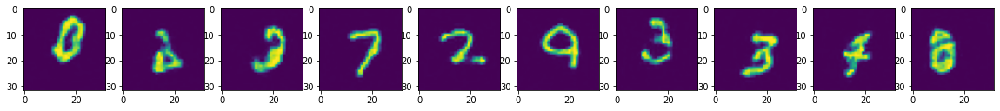

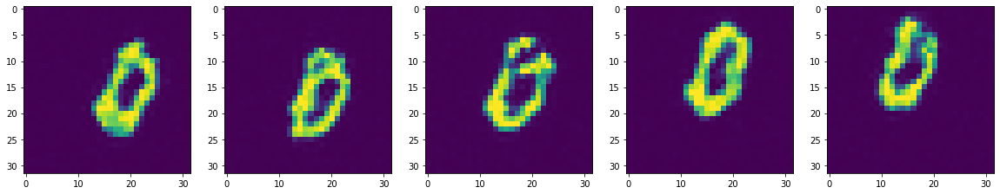

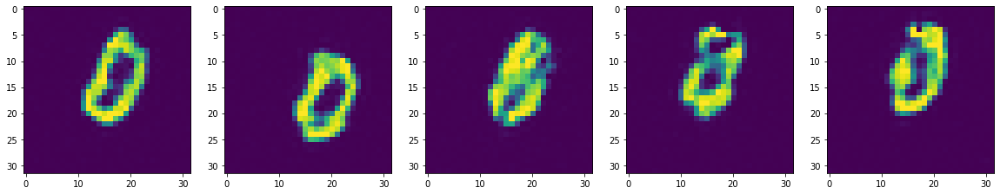

kl: tensor(0.0218, device='cuda:0') and tensor(5.8489, device='cuda:0')


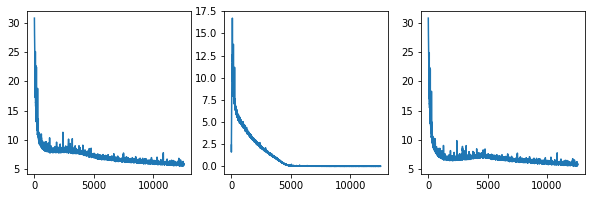

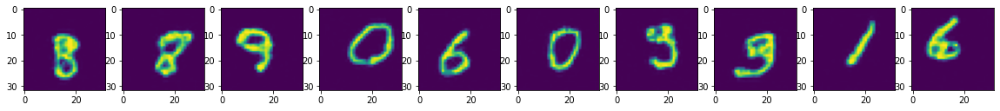

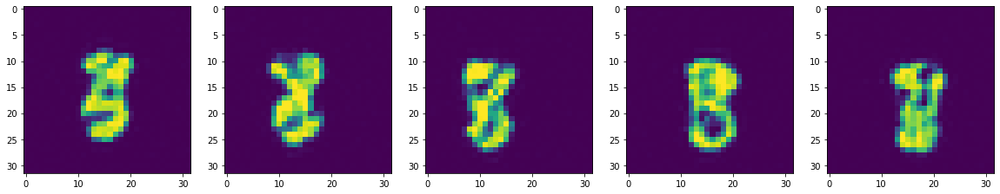

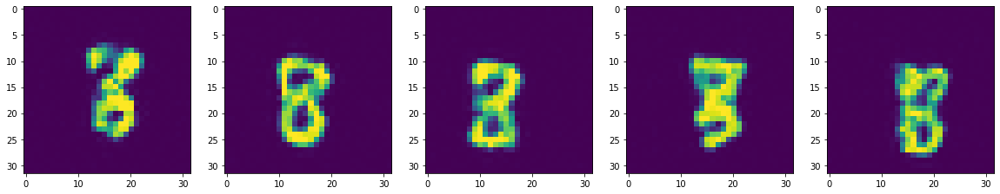

Epoch 27 Loss: 5.85


kl: tensor(0.0072, device='cuda:0') and tensor(5.6568, device='cuda:0')


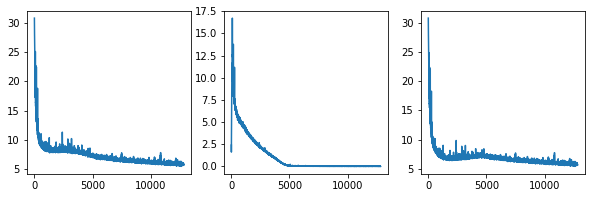

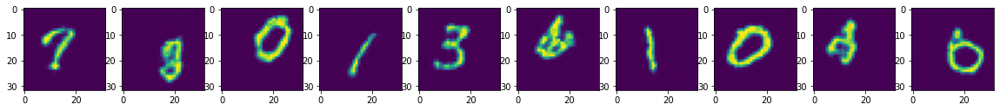

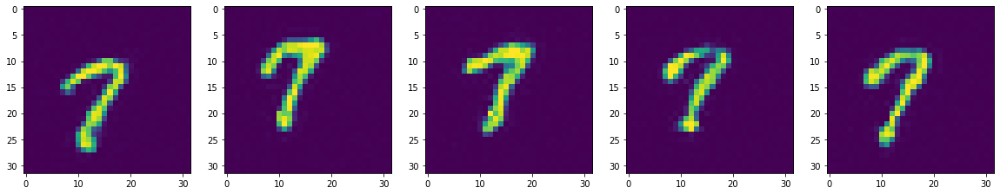

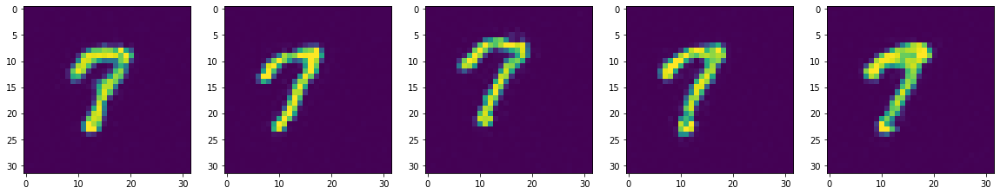

kl: tensor(0.0079, device='cuda:0') and tensor(5.5294, device='cuda:0')


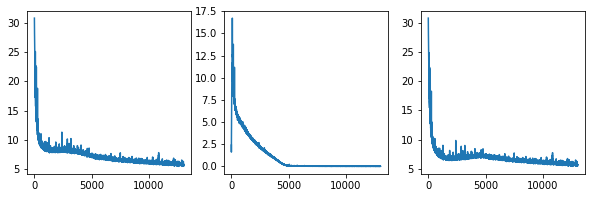

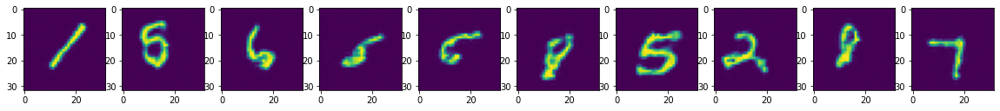

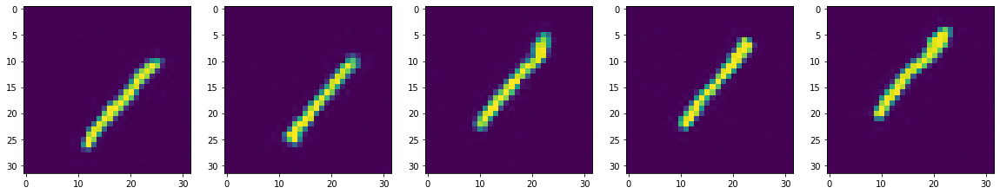

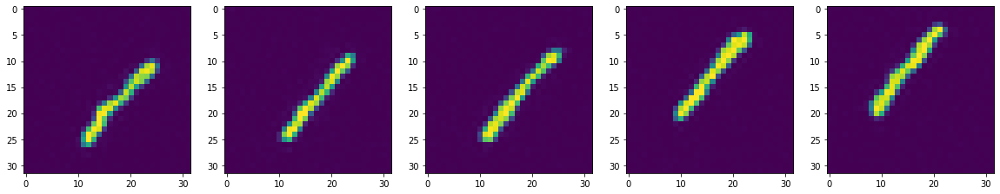

Epoch 28 Loss: 5.80


kl: tensor(0.0060, device='cuda:0') and tensor(5.6849, device='cuda:0')


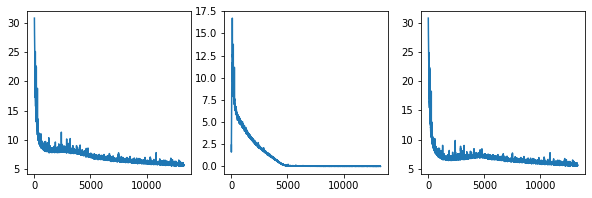

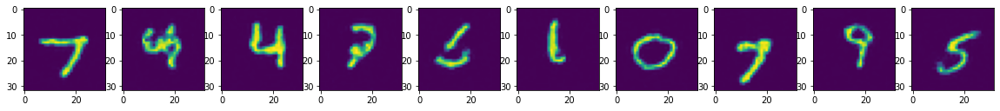

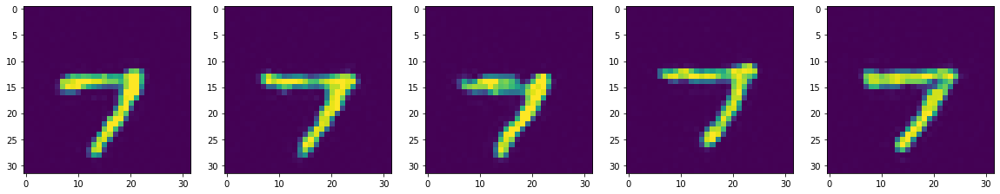

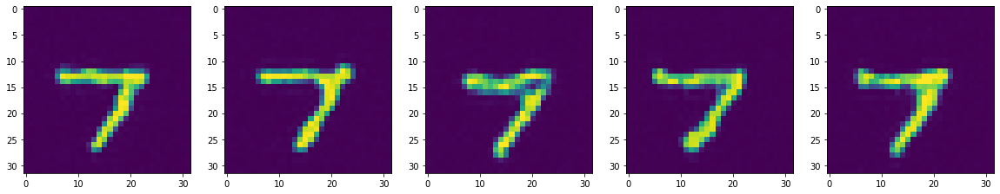

kl: tensor(0.0108, device='cuda:0') and tensor(5.7242, device='cuda:0')


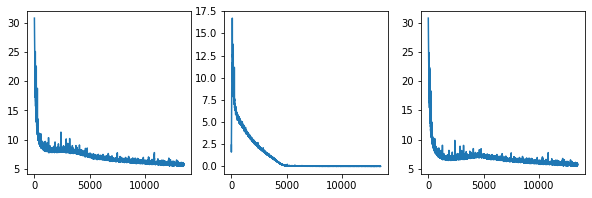

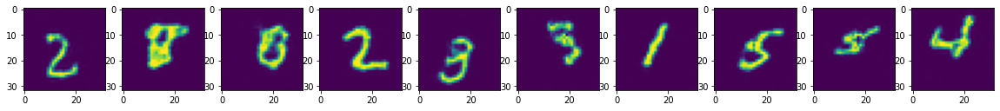

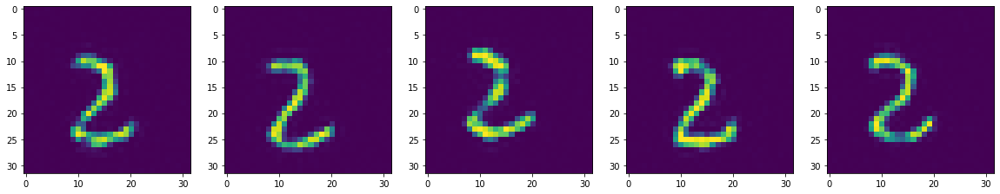

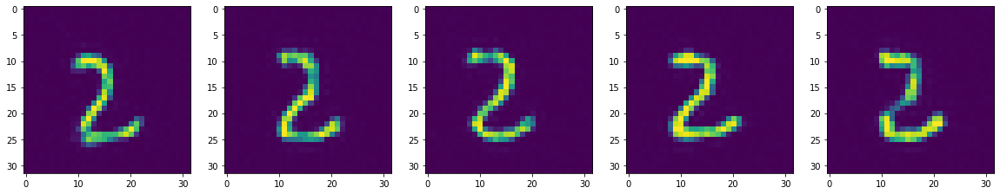

Epoch 29 Loss: 5.76


kl: tensor(0.0153, device='cuda:0') and tensor(5.8022, device='cuda:0')


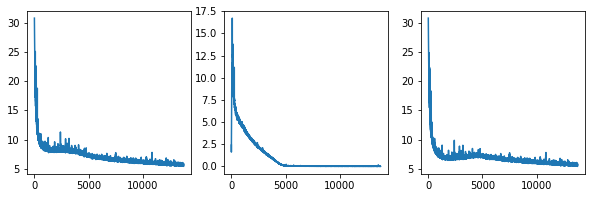

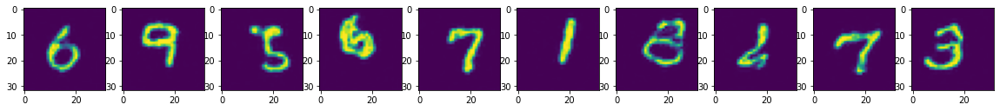

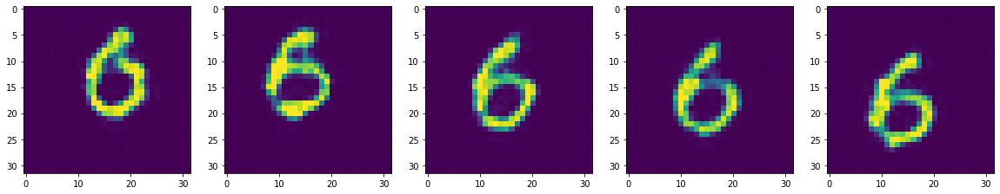

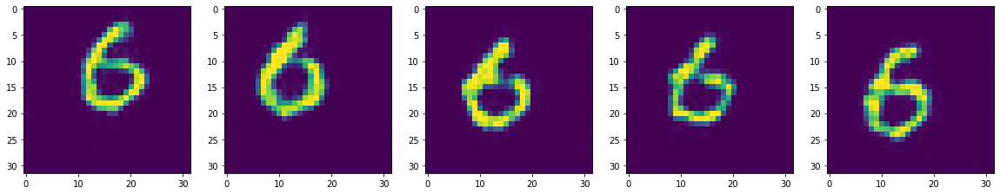

kl: tensor(0.0051, device='cuda:0') and tensor(5.5715, device='cuda:0')


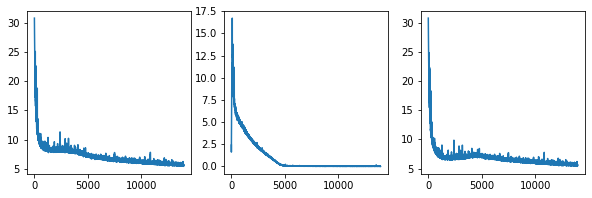

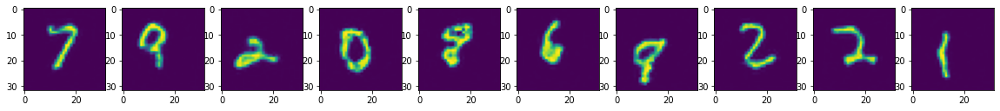

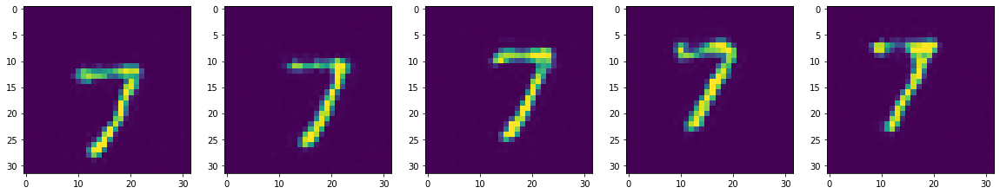

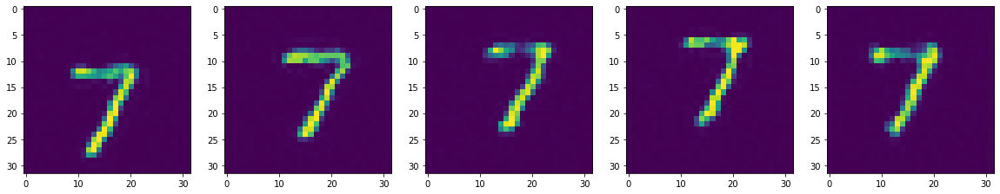

Epoch 30 Loss: 5.71


kl: tensor(0.0073, device='cuda:0') and tensor(5.5691, device='cuda:0')


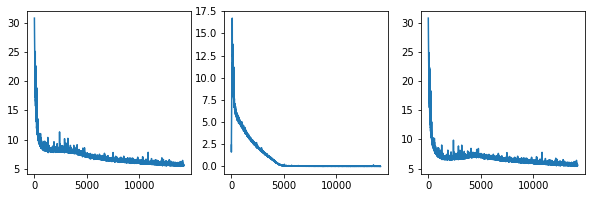

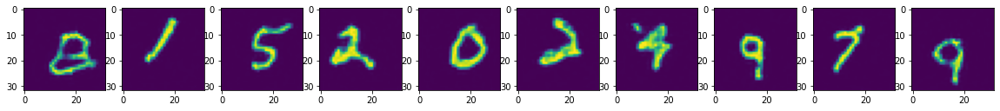

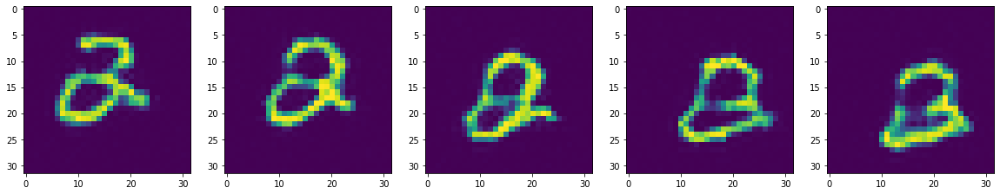

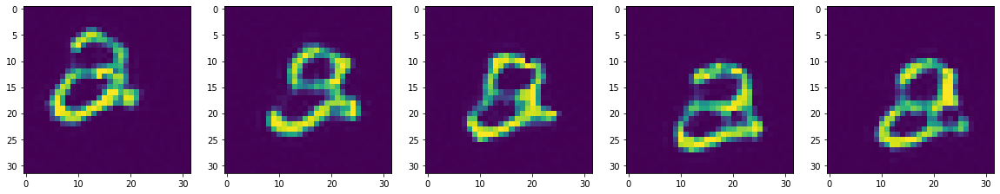

kl: tensor(0.0052, device='cuda:0') and tensor(5.6155, device='cuda:0')


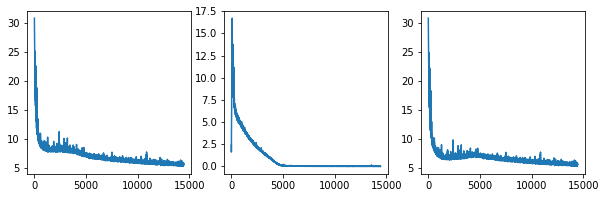

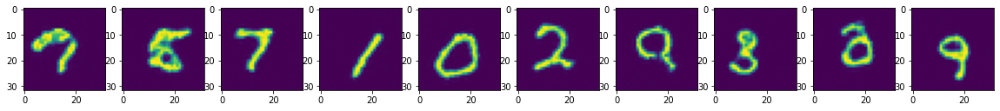

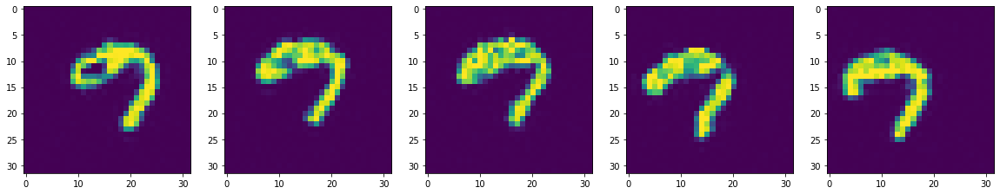

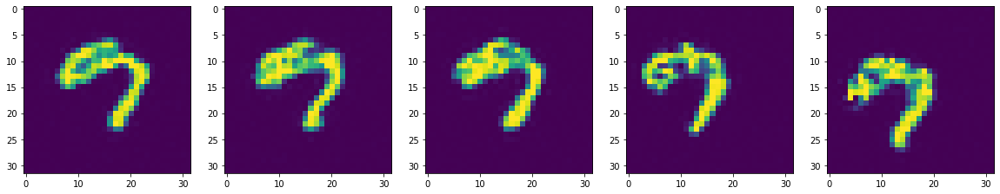

Epoch 31 Loss: 5.68


kl: tensor(0.0266, device='cuda:0') and tensor(5.6040, device='cuda:0')


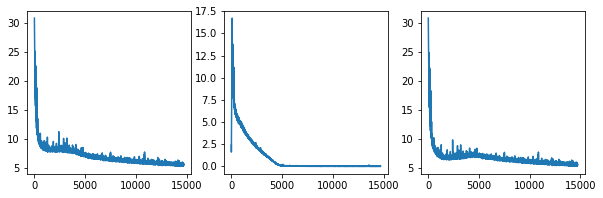

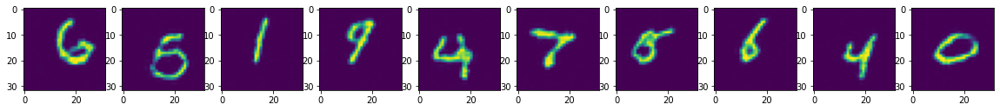

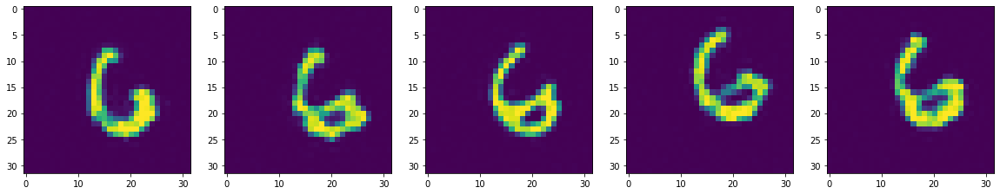

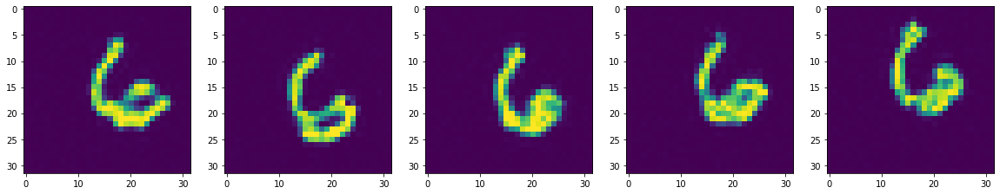

kl: tensor(0.0103, device='cuda:0') and tensor(5.6219, device='cuda:0')


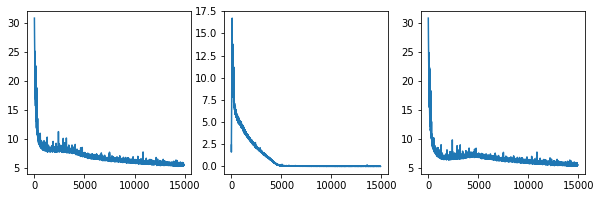

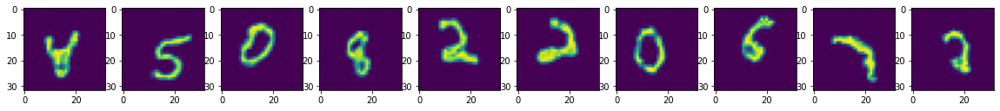

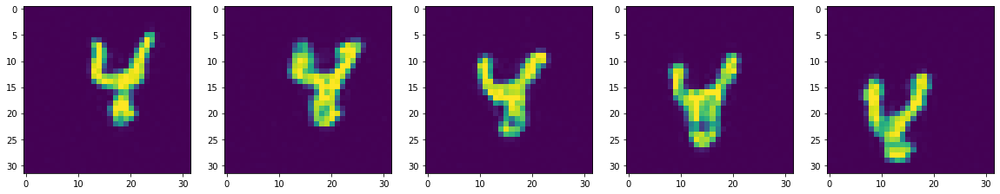

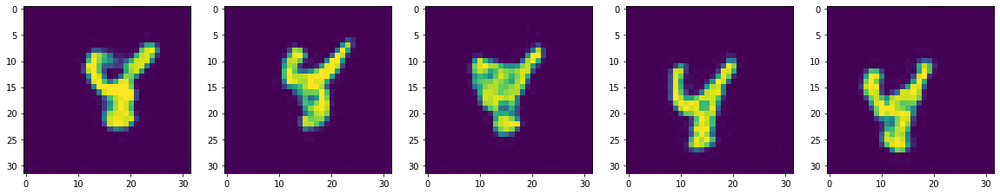

Epoch 32 Loss: 5.63


kl: tensor(0.0083, device='cuda:0') and tensor(5.4510, device='cuda:0')


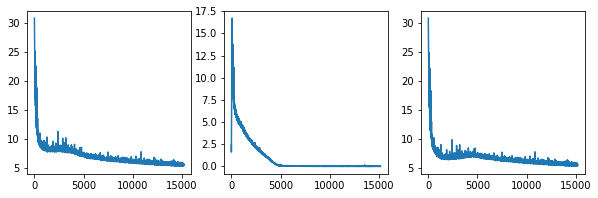

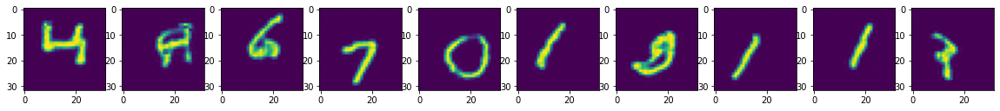

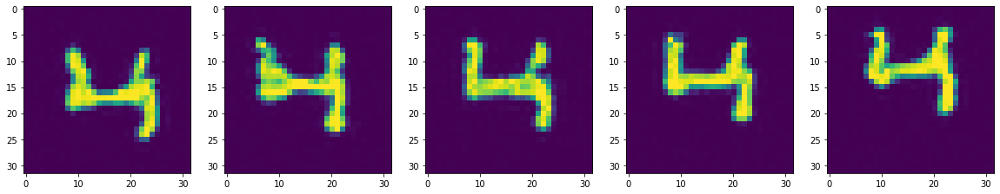

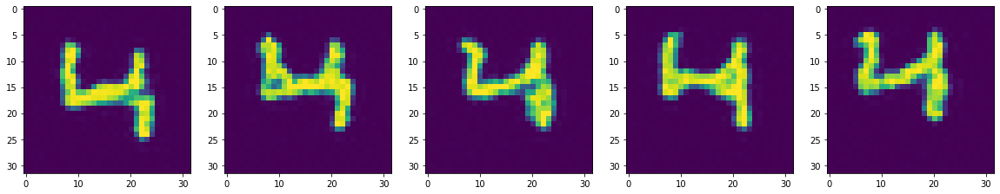

kl: tensor(0.0127, device='cuda:0') and tensor(5.5551, device='cuda:0')


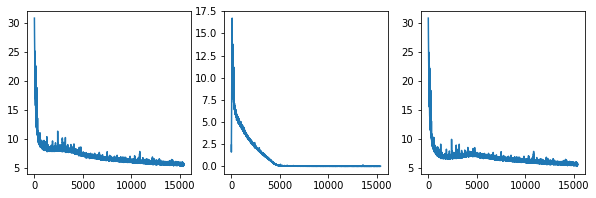

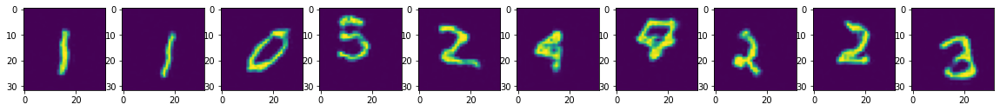

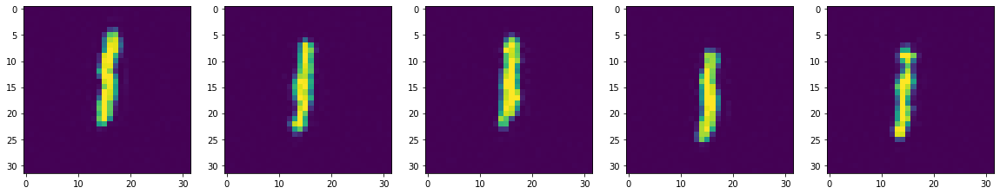

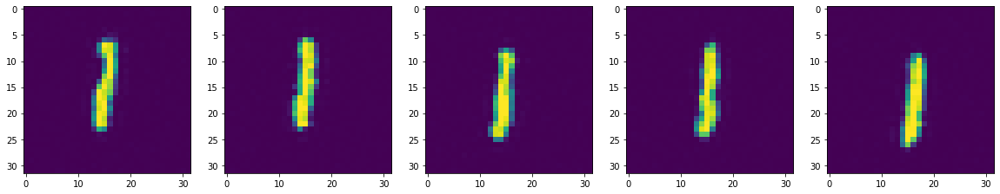

Epoch 33 Loss: 5.59


kl: tensor(0.0068, device='cuda:0') and tensor(5.4669, device='cuda:0')


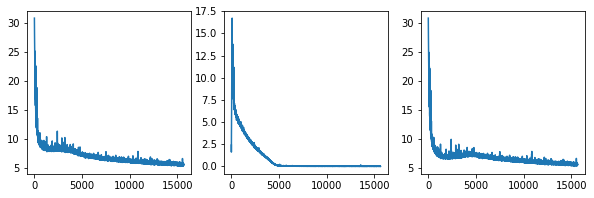

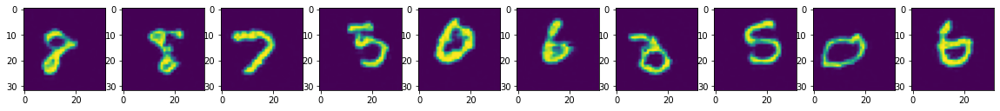

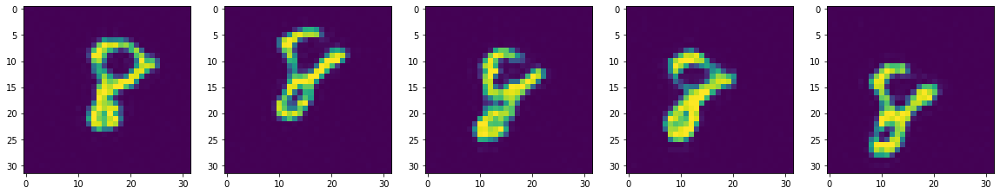

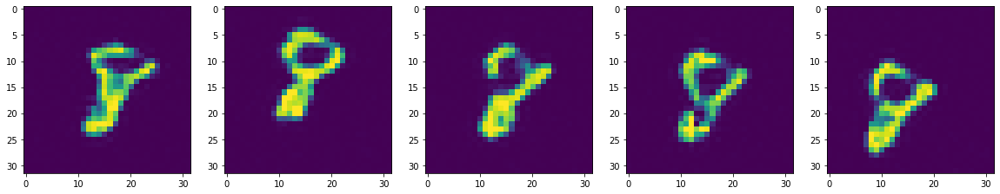

kl: tensor(0.0085, device='cuda:0') and tensor(5.5900, device='cuda:0')


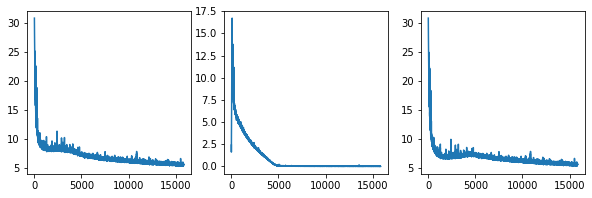

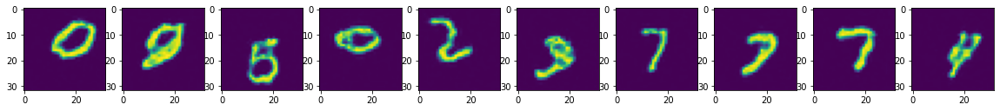

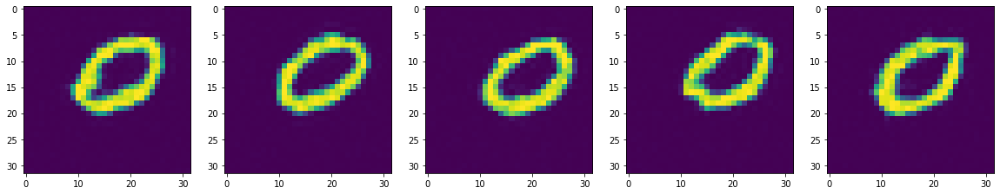

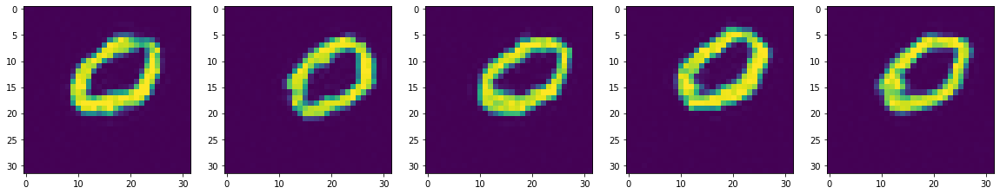

Epoch 34 Loss: 5.57


kl: tensor(0.0048, device='cuda:0') and tensor(5.6161, device='cuda:0')


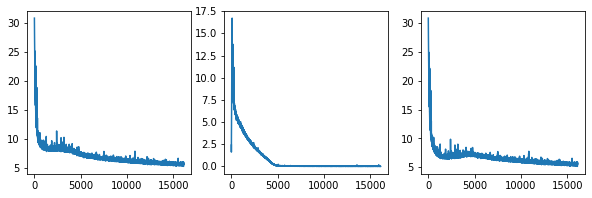

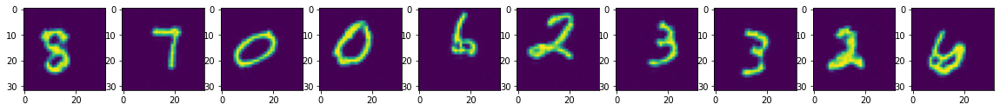

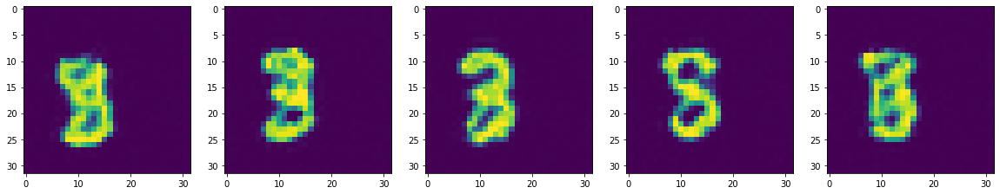

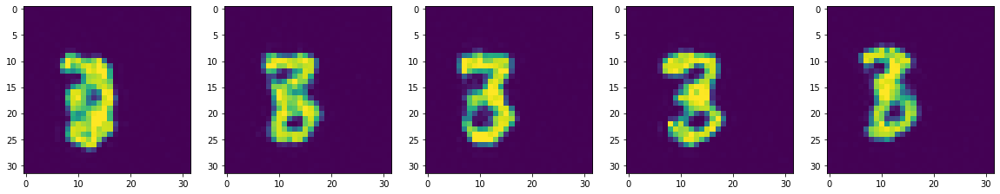

kl: tensor(0.0075, device='cuda:0') and tensor(5.4606, device='cuda:0')


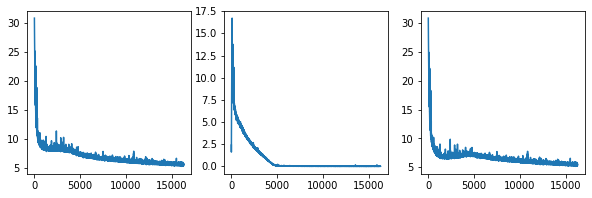

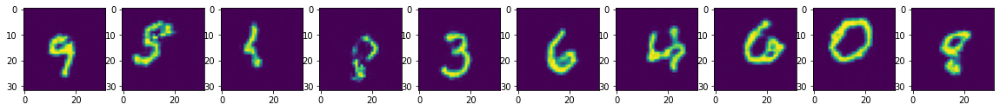

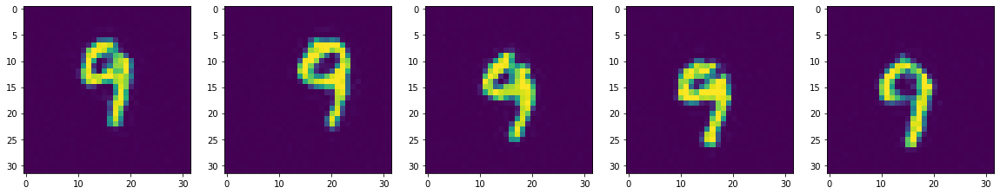

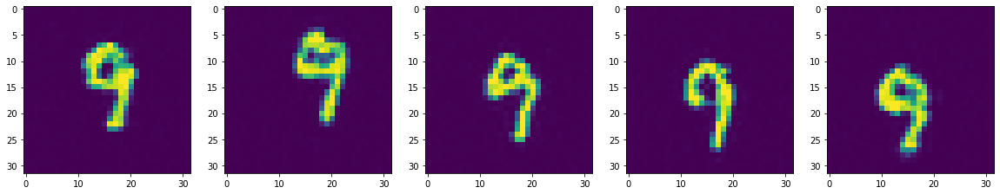

Epoch 35 Loss: 5.53


kl: tensor(0.0105, device='cuda:0') and tensor(5.3615, device='cuda:0')


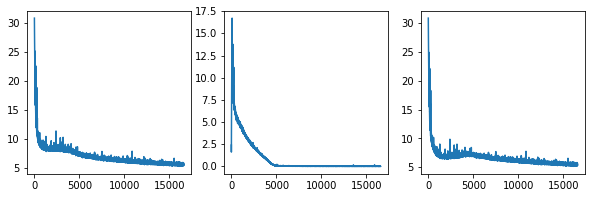

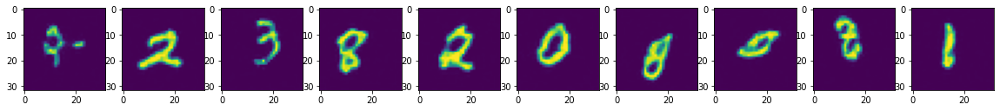

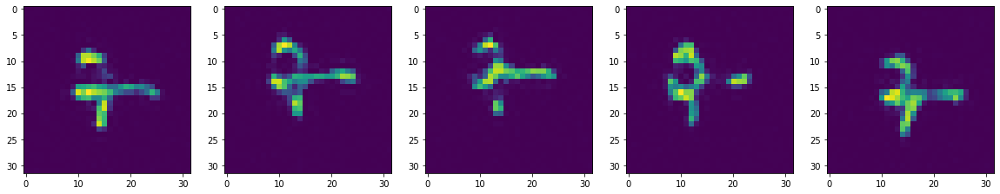

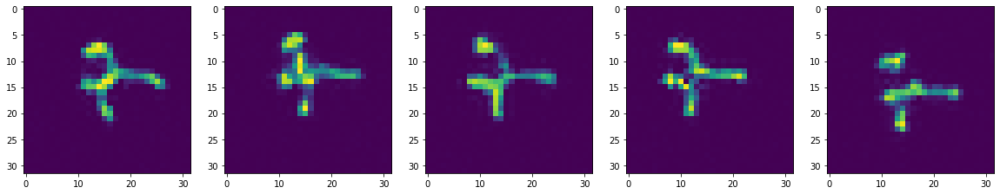

kl: tensor(0.0076, device='cuda:0') and tensor(5.3557, device='cuda:0')


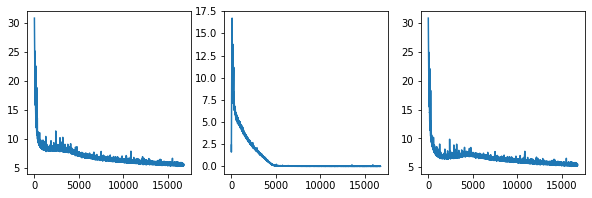

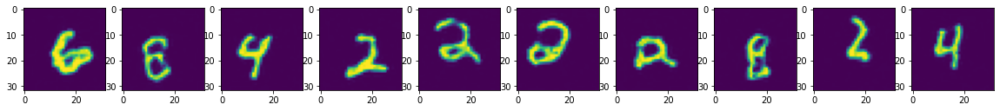

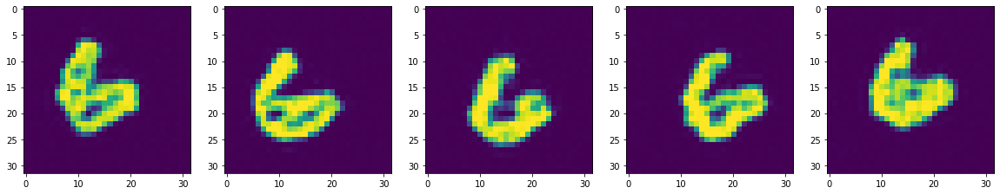

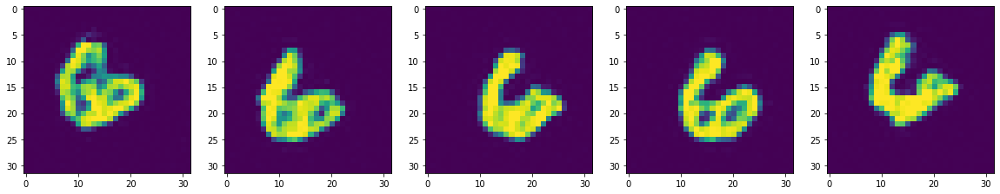

Epoch 36 Loss: 5.50


kl: tensor(0.0060, device='cuda:0') and tensor(5.4319, device='cuda:0')


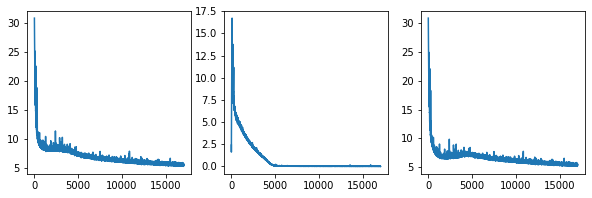

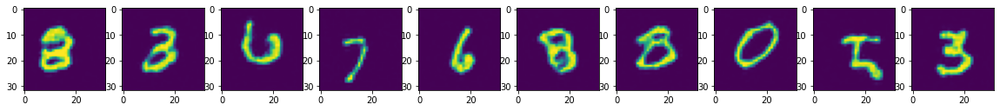

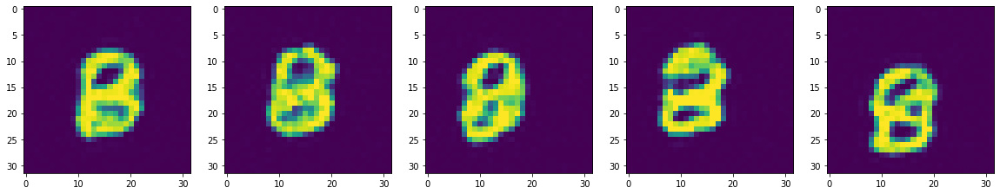

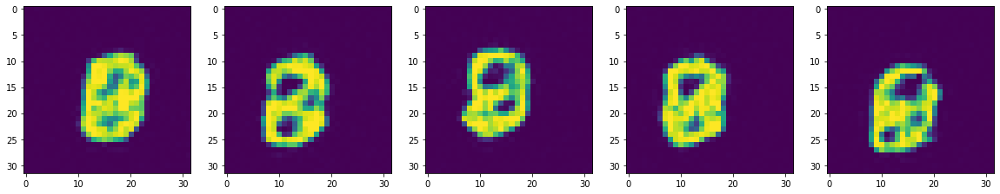

kl: tensor(0.0055, device='cuda:0') and tensor(5.4965, device='cuda:0')


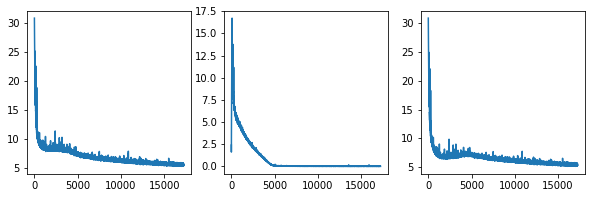

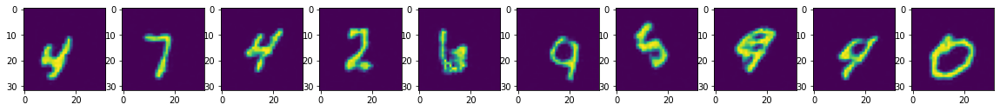

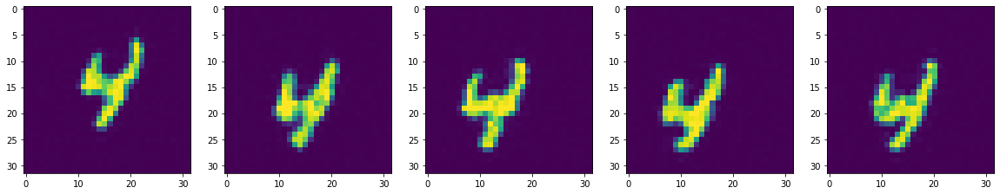

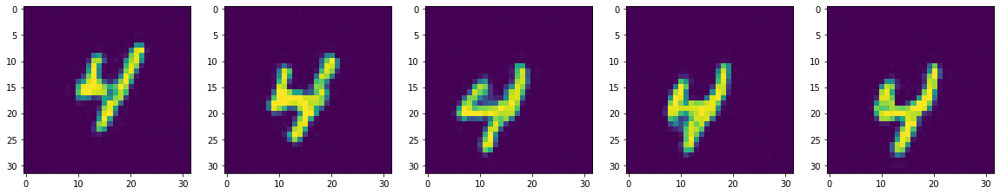

Epoch 37 Loss: 5.49


kl: tensor(0.0052, device='cuda:0') and tensor(5.4717, device='cuda:0')


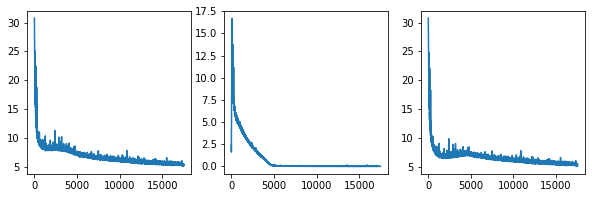

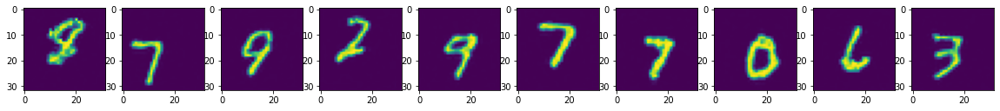

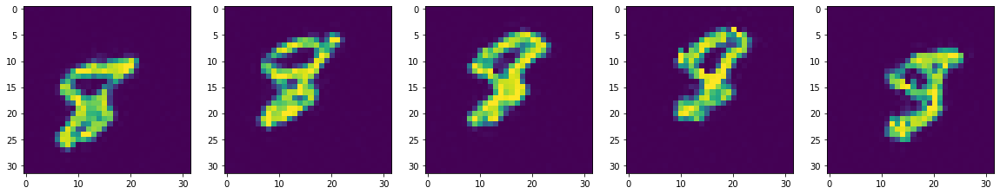

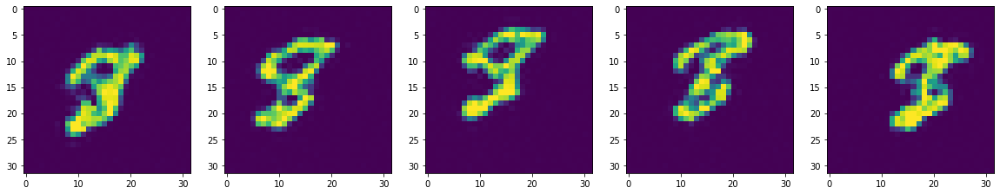

kl: tensor(0.0047, device='cuda:0') and tensor(5.1447, device='cuda:0')


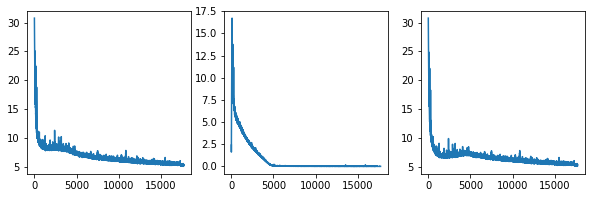

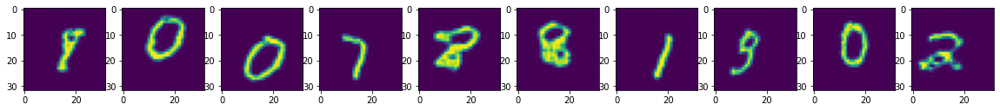

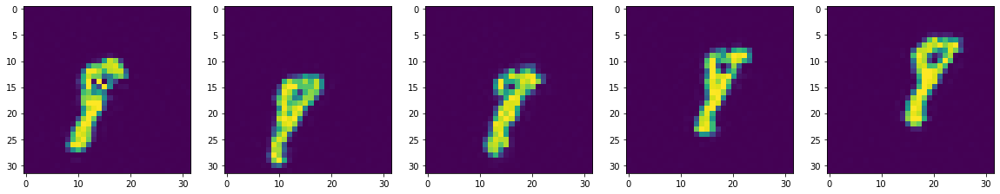

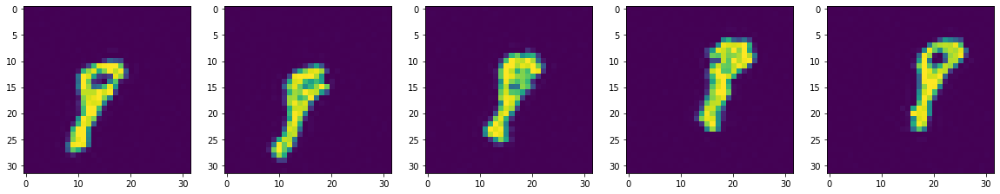

Epoch 38 Loss: 5.28


In [ ]:
n_bits = 7
class Solver(object):
    def __init__(self, learning_rate=0.0001, n_epochs=128):
        self.train_loader, self.test_loader = self.create_loaders()
        self.n_epochs = n_epochs
        self.learning_rate = learning_rate
        self.n_batches_in_epoch = len(self.train_loader)

    def build(self):
        self.model = Model().to(device)
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=self.learning_rate)
        self.scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(self.optimizer, 'min', patience=4, factor = 0.5)

    def create_loaders(self):
        train_loader=DataLoader(trainset, batch_size=batch_size, shuffle=True, drop_last = True)
        test_loader=DataLoader(testset, batch_size=batch_size, shuffle=True, drop_last = True)
        return train_loader, test_loader
    
    def uniform_binning_correction(self, x, n_bits=8):
        b, t, c, h, w = x.size()
        n_bins = 2 ** n_bits
        chw = c * h * w
        x += torch.zeros_like(x).uniform_(0, 1.0 / n_bins)
        objective = -np.log(n_bins) * chw * torch.ones(b, device=x.device)
        return x, objective

    def preprocess(self, x, reverse=False, range="0.5", n_bits = 8):

        n_bins = 2 ** n_bits
        if range == "0.5":
          if reverse == False:
            x = x * 255 # scale to 255
            if n_bits < 8:
              x = torch.floor( x/2 ** (8 - n_bits))
            x = x / n_bins  - 0.5
          else:
            x = torch.clamp(x, -0.5, 0.5)
            x = x + 0.5
            x = x * n_bins
            x = torch.clamp(x * (255 / n_bins), 0, 255).byte()
        elif range == "1.0":
          if reverse == False:
            x = x * 255 # scale to 255
            if n_bits < 8:
              x = torch.floor( x/2 ** (8 - n_bits))
            x = x / n_bins  
          else:
            x = torch.clamp(x, 0, 1)
            x = x * n_bins
            x = torch.clamp(x * (255 / n_bins), 0, 255).byte()
        return x

    def train(self):
        self.losses = []
        train_losses = []
        val_losses = []
        self.kl_loss = []
        self.recon_loss = []

        counter = 0
        iterations = 4000

        for epoch_i in range(self.n_epochs):
            epoch_i += 1
            self.batch_loss_history = []
            for batch_i, image in enumerate(tqdm(self.train_loader, desc='Batch', leave=False)):
                image = image.to(device)

                image = self.preprocess(image, n_bits = n_bits)
                image, log_det = self.uniform_binning_correction(image, n_bits = n_bits)
                
                self.model.beta =min(2, 0.0001 + (counter+1)/iterations)
                loss = self.model.loss(image, log_det)
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()

                if (batch_i+1) % 200 == 0:
                  self.plotter()     
                self.batch_loss_history.append(float(loss.data))
                self.losses.append(loss.data)
                self.kl_loss.append(self.model.book['kl'])
                self.recon_loss.append(self.model.book['nll'])
                counter += 1
            epoch_loss = np.mean(self.batch_loss_history)
            self.scheduler.step(loss)
            print(f'Epoch {epoch_i} Loss: {epoch_loss:.2f}')
            train_losses.append(epoch_loss)
        return train_losses

    def plotter(self):
      fig, ax = plt.subplots(1, 3 , figsize = (10,3))
      ax[0].plot(self.losses)
      ax[1].plot(self.kl_loss)
      ax[2].plot(self.recon_loss)
      print("kl: {} and {}".format(str(self.kl_loss[-1]), str(self.recon_loss[-1])))
      
      with torch.no_grad():
        self.model.eval()

        image = next(iter(self.test_loader)).to(device)

        image  = self.preprocess(image, reverse=False, n_bits = n_bits)
        image, _ = self.uniform_binning_correction(image, n_bits = n_bits)
        samples = self.model.sample(image)
        samples_enc = self.model.sample_enc(image)
        samples  = self.preprocess(samples, reverse=True, n_bits = n_bits)
        samples_enc  = self.preprocess(samples_enc, reverse=True, n_bits = n_bits)
        self.model.train()
      fig, ax = plt.subplots(1, 10 , figsize = (20,5))
      for i in range(0,10):
        ax[i].imshow(samples[3, i,:,:,:].view(-1, 32).detach().cpu().numpy())
      fig, ax = plt.subplots(1, 5 , figsize = (20,5))
      for i in range(0,5):
        ax[i].imshow(samples[i, 0,:,:,:].view(-1, 32).detach().cpu().numpy())
      fig, ax = plt.subplots(1, 5 , figsize = (20,5))
      for i in range(0,5):
        ax[i].imshow(samples_enc[i, 0,:,:,:].view(-1, 32).detach().cpu().numpy())
      plt.show()


solver = Solver(n_epochs=60, learning_rate=0.0002)
solver.build()
train = solver.train()
